Using reference image: images/01.jpg
Found 16 images to process
Input folder: images
Output folder: trial
Steps folder: trial\processing_steps

Processing 01.jpg (1/16)


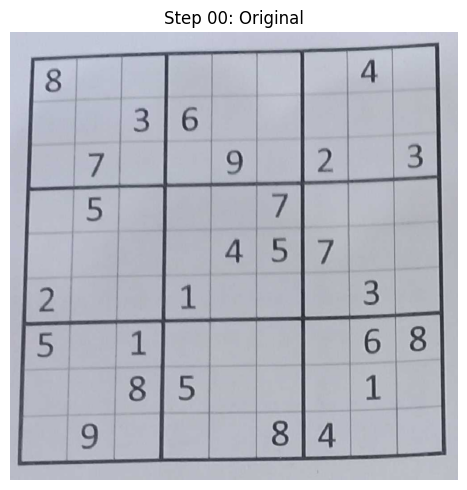

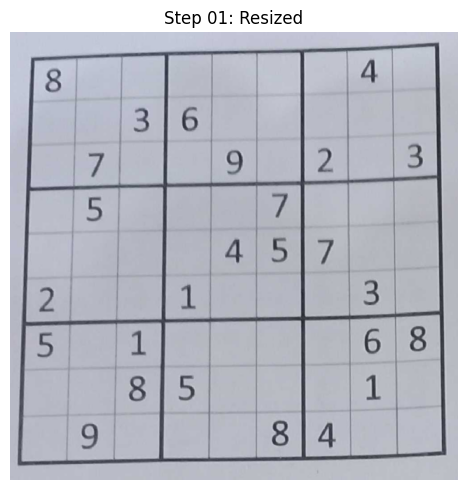

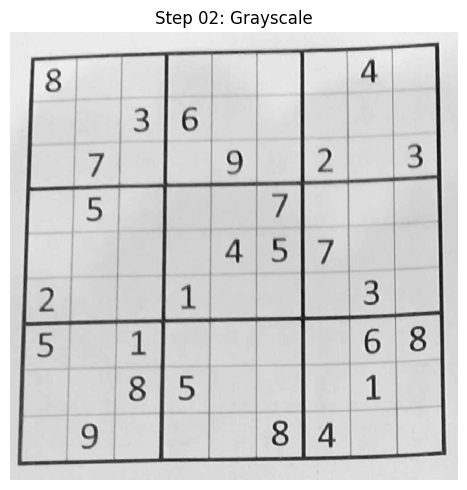

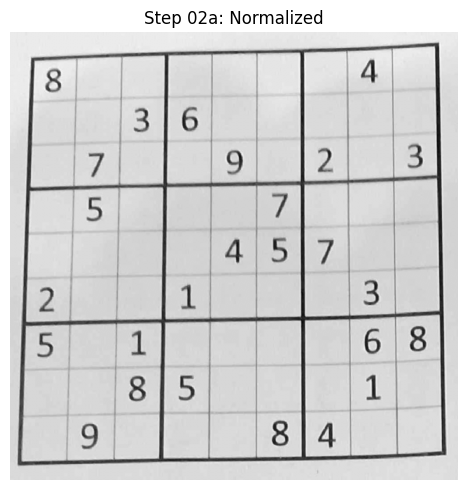

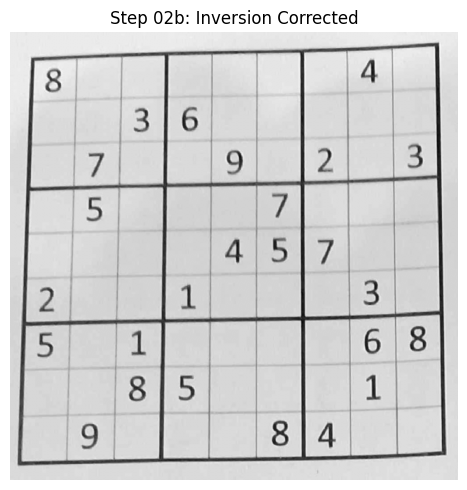

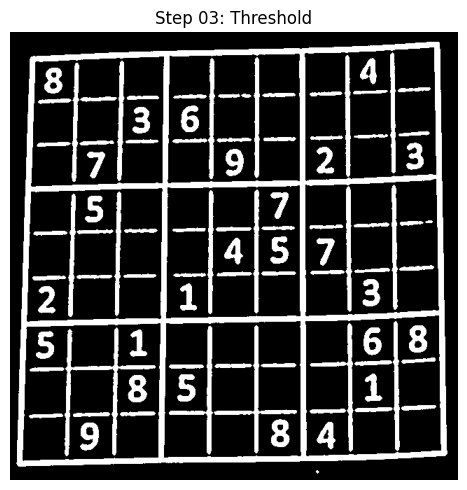

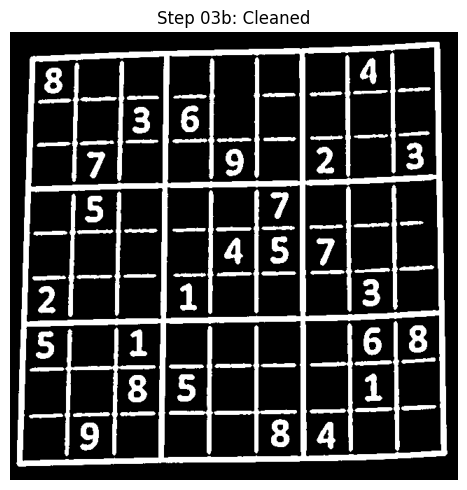

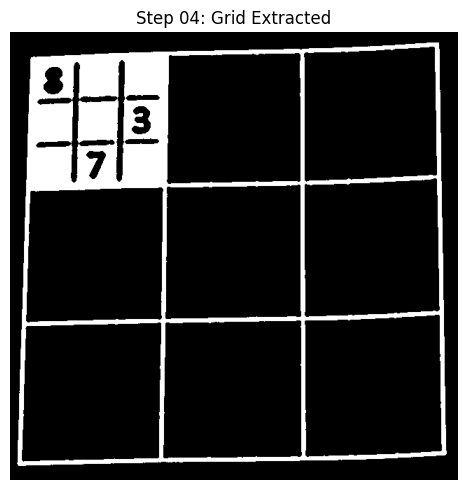

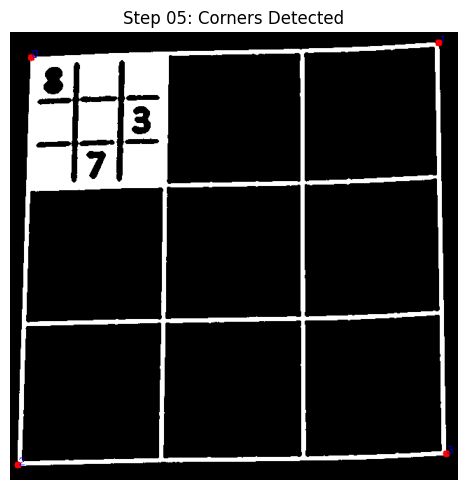

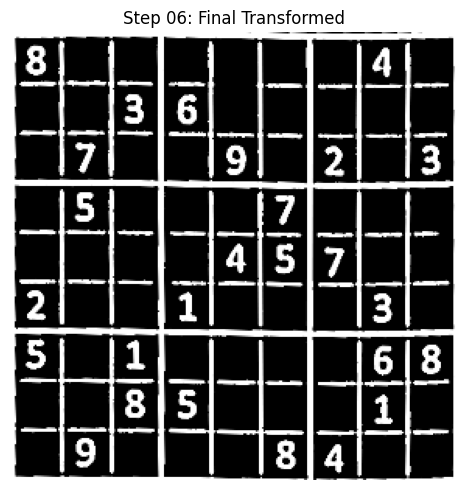

  Successfully processed and saved: trial\01.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 02.jpg (2/16)


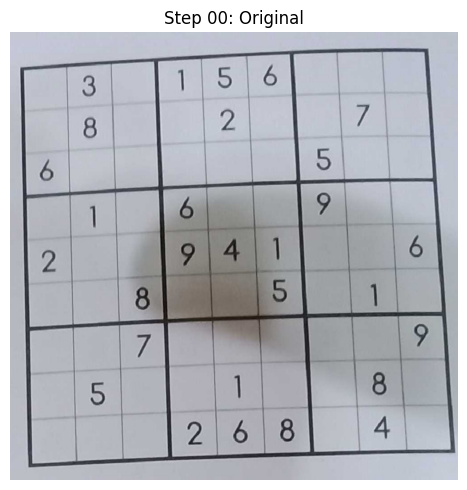

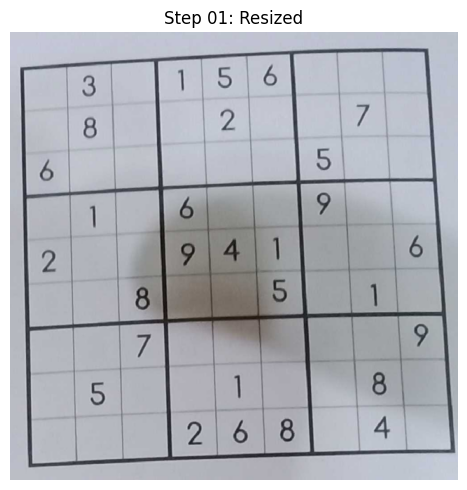

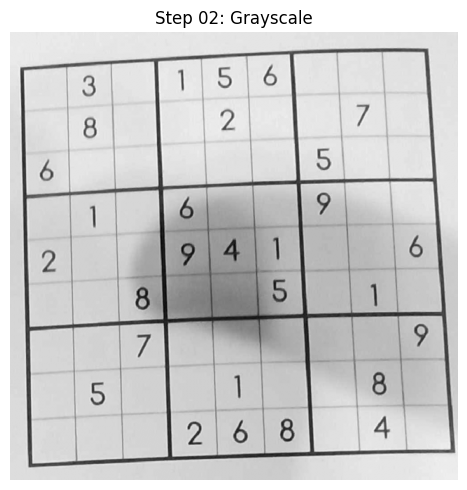

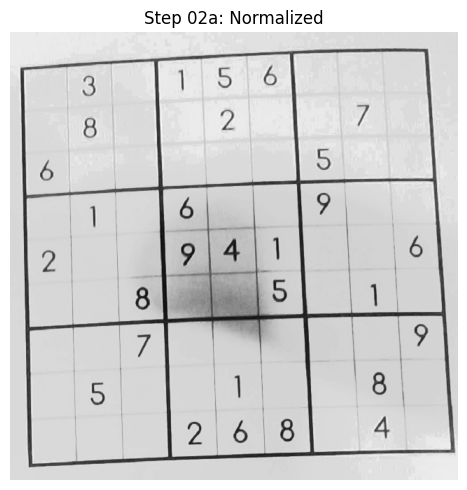

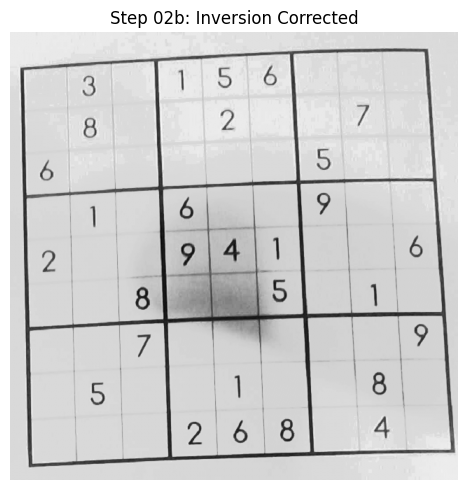

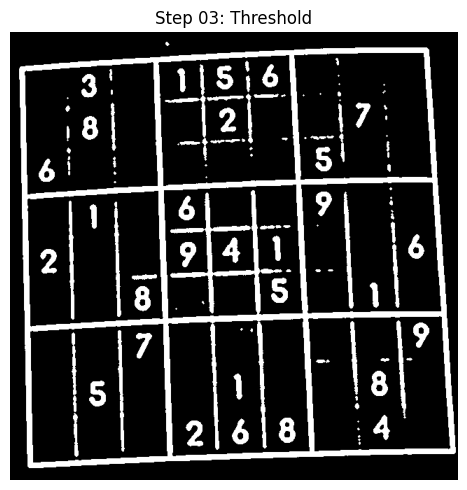

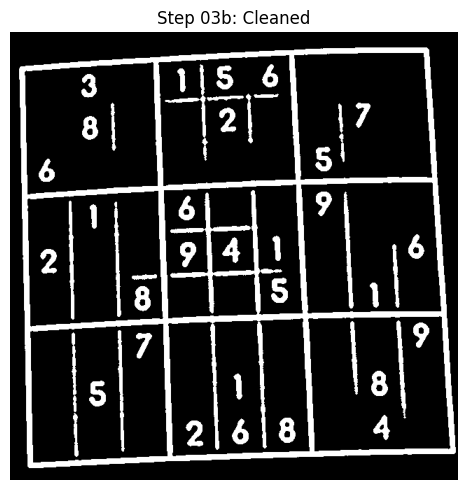

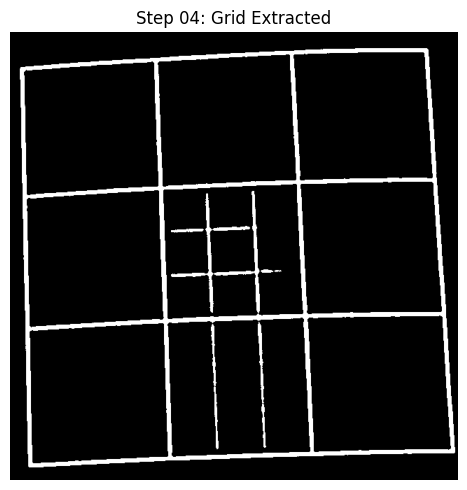

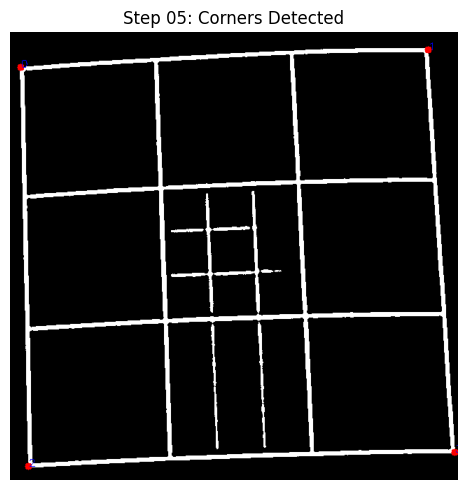

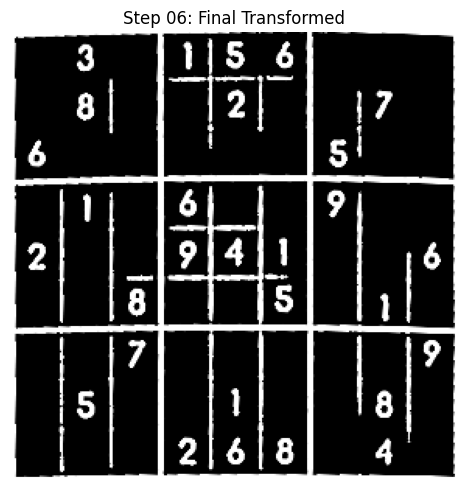

  Successfully processed and saved: trial\02.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 03.jpg (3/16)


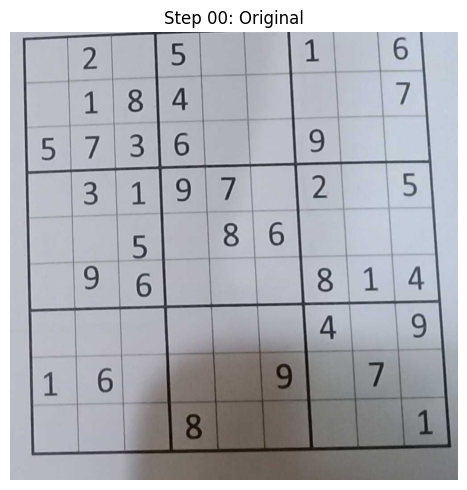

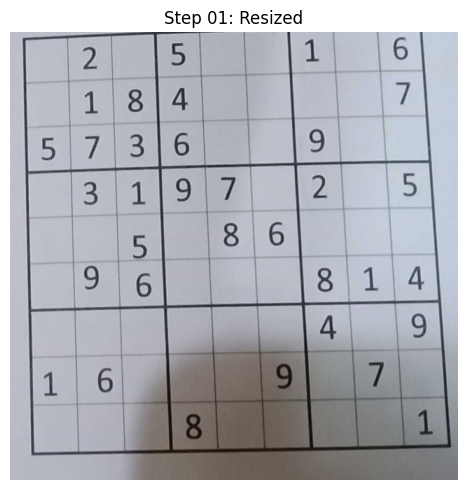

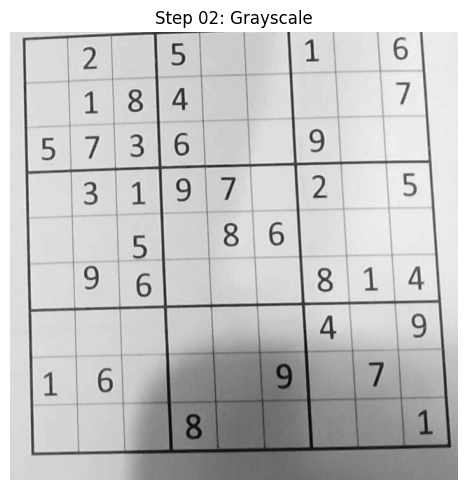

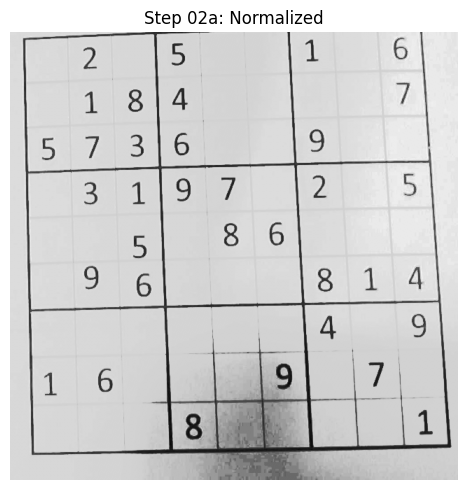

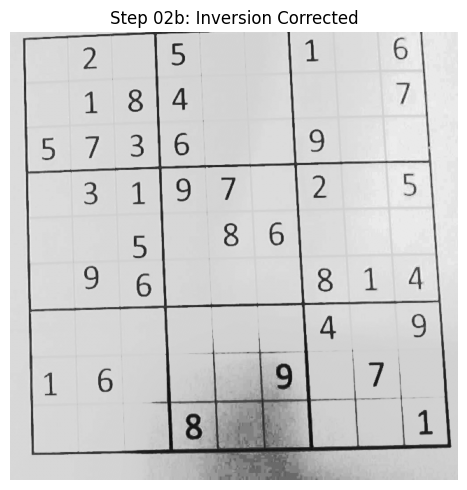

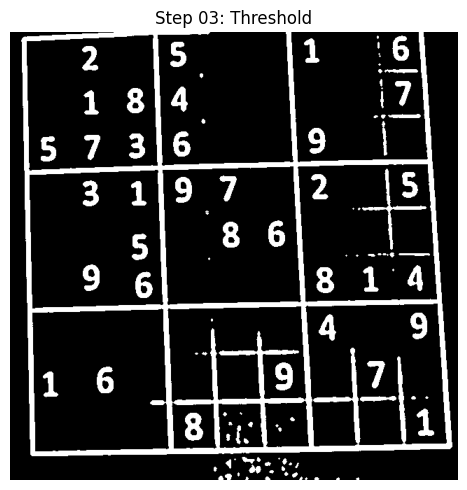

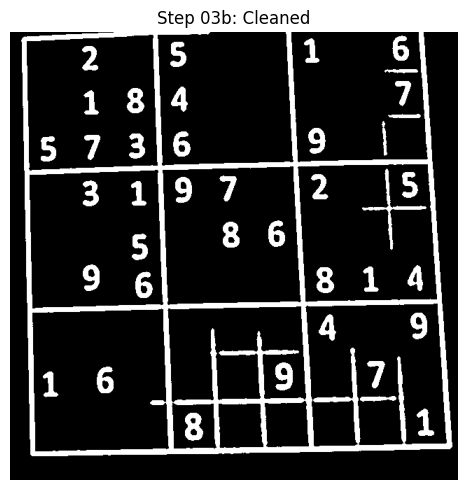

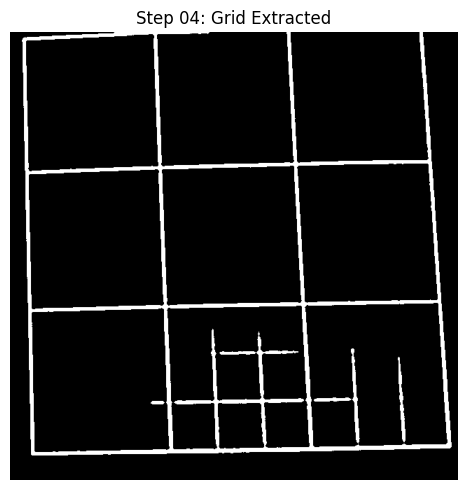

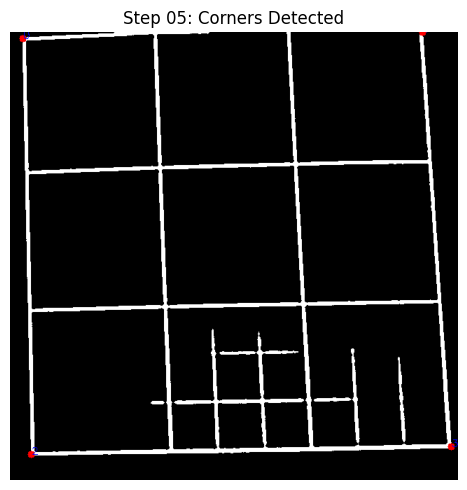

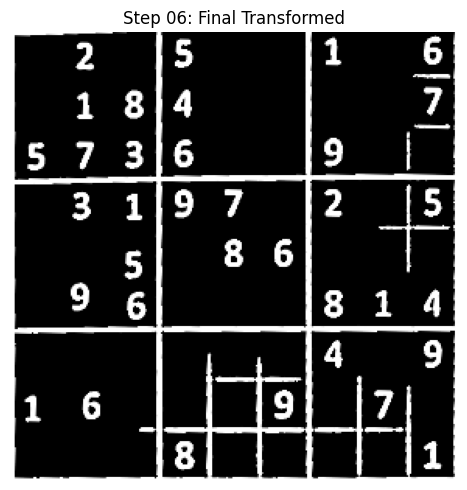

  Successfully processed and saved: trial\03.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 04.jpg (4/16)


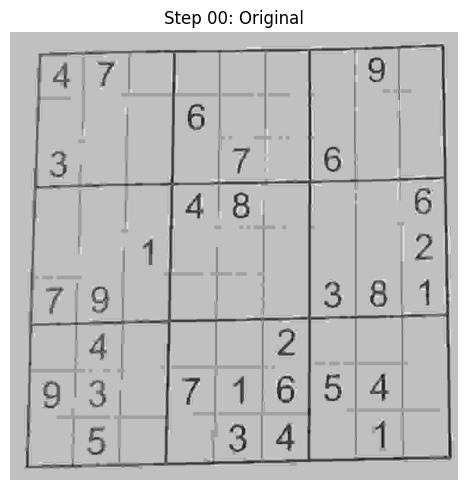

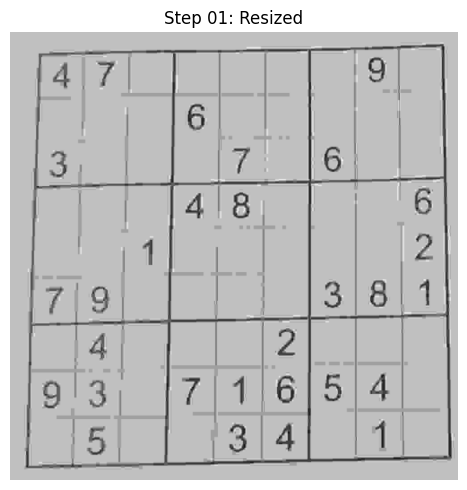

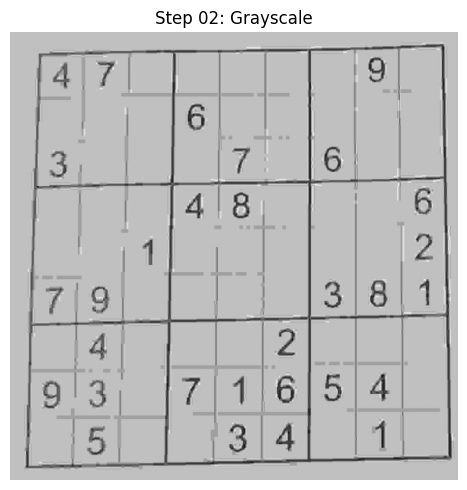

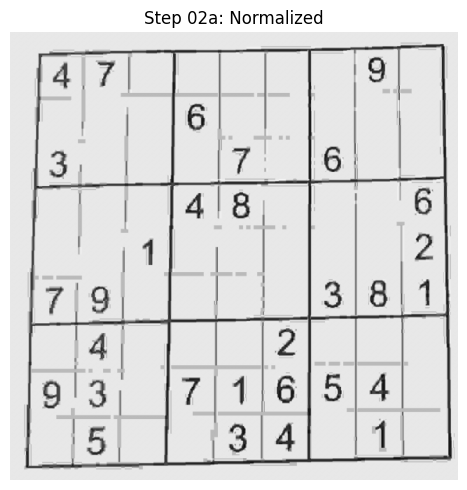

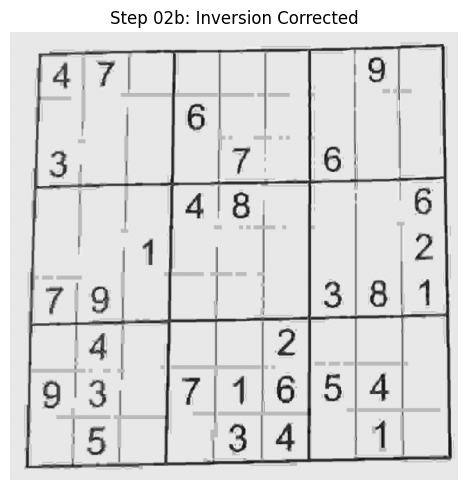

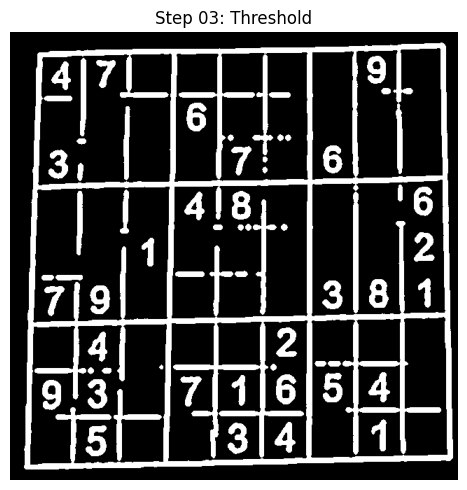

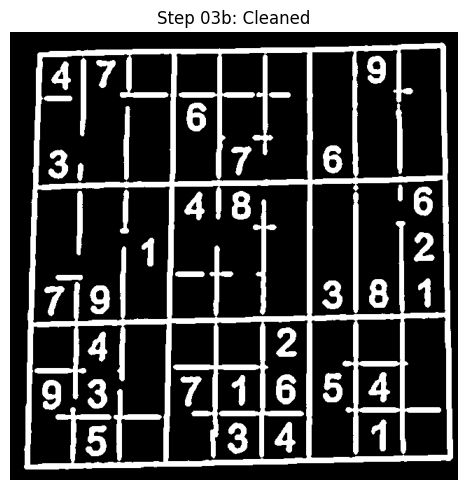

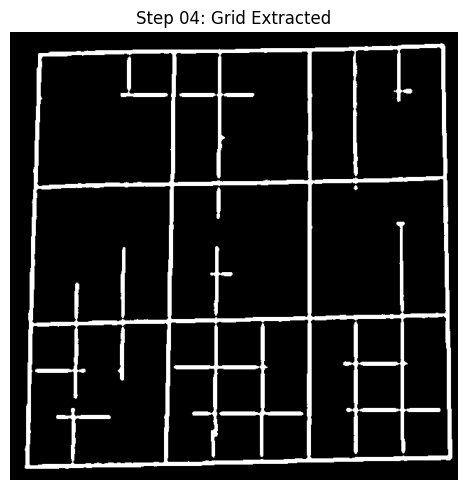

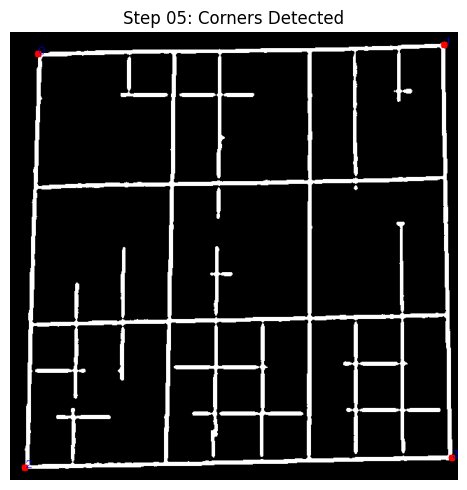

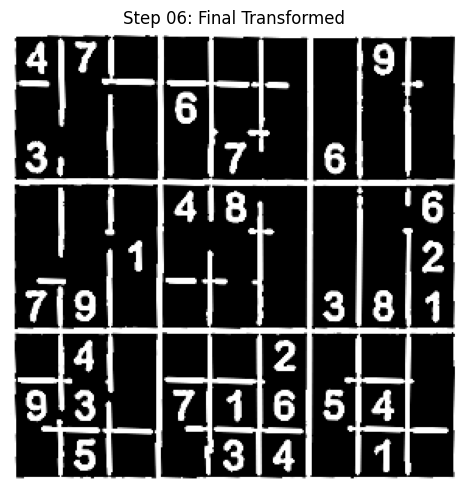

  Successfully processed and saved: trial\04.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 05.jpg (5/16)


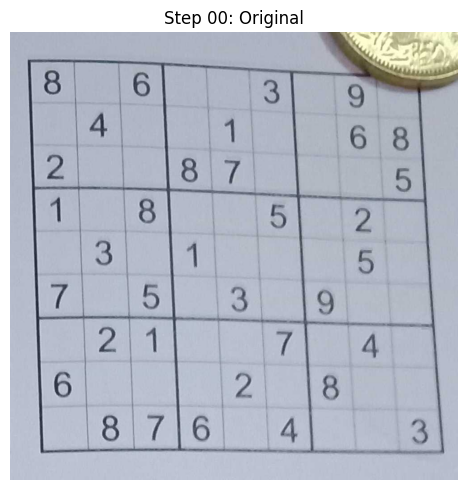

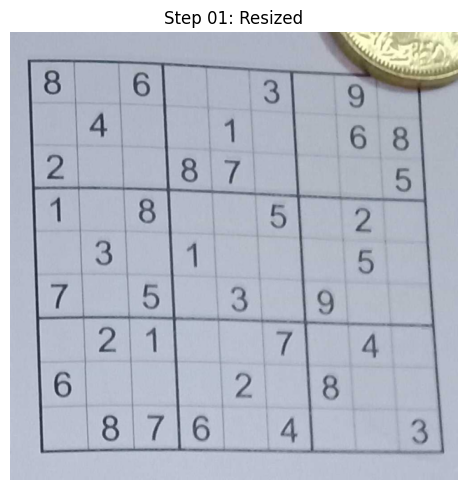

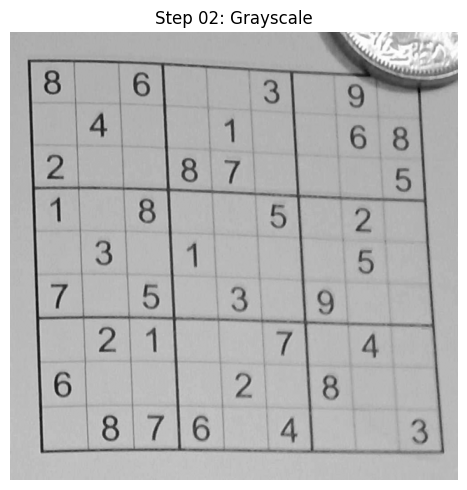

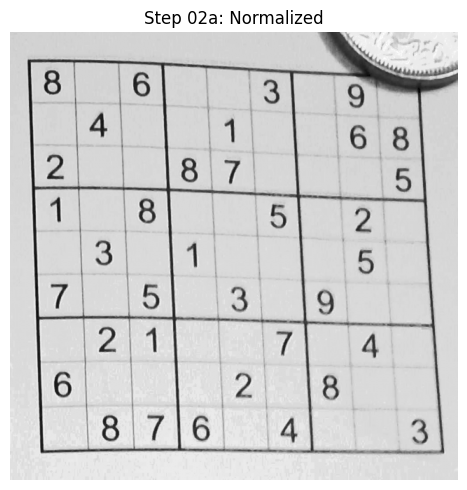

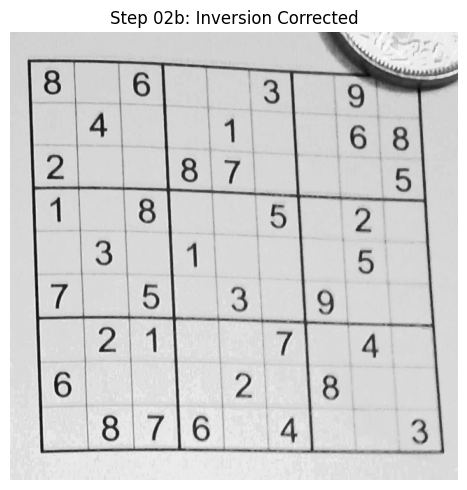

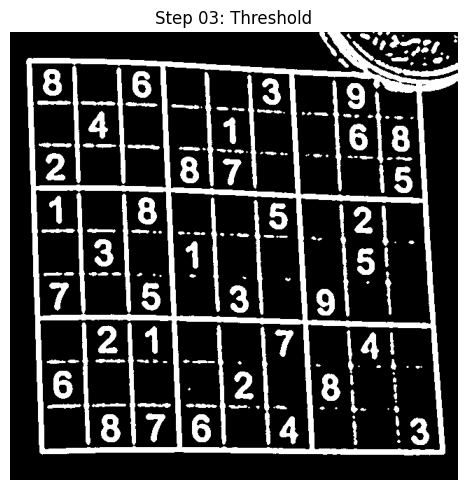

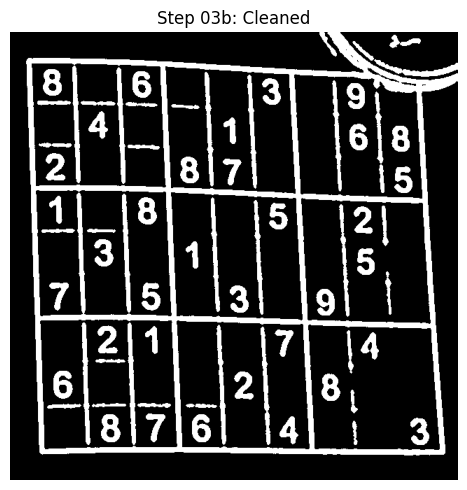

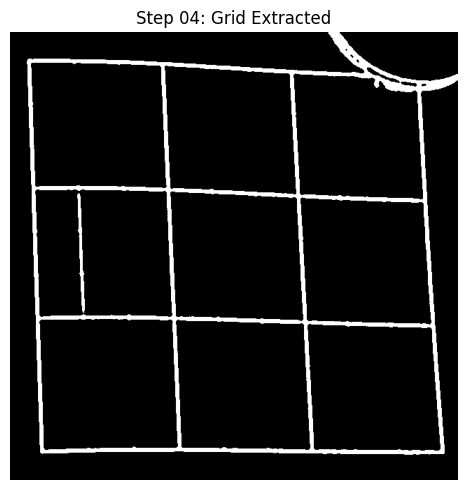

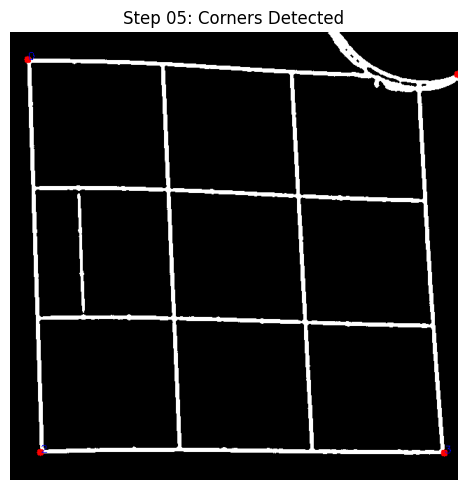

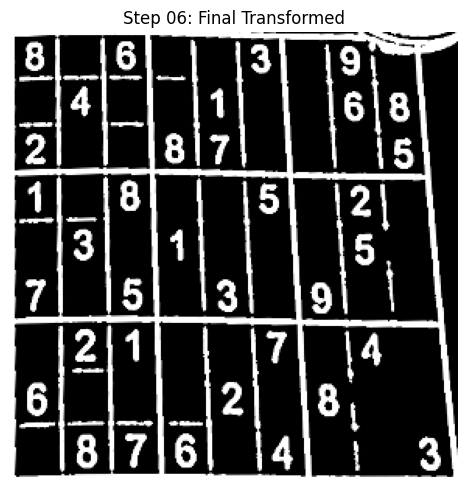

  Successfully processed and saved: trial\05.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 06.jpg (6/16)


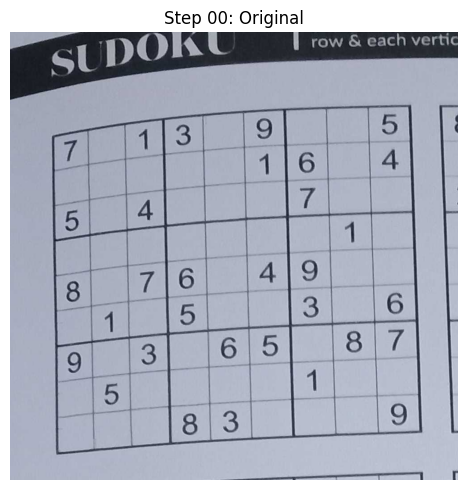

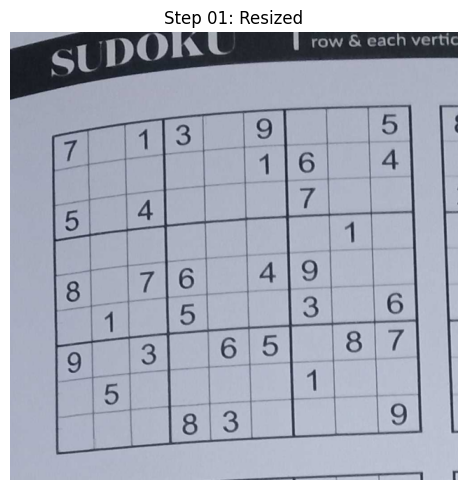

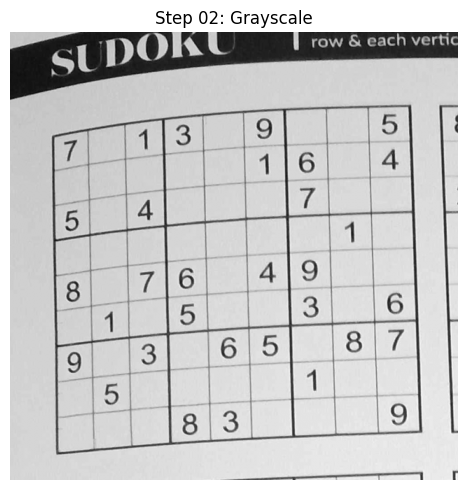

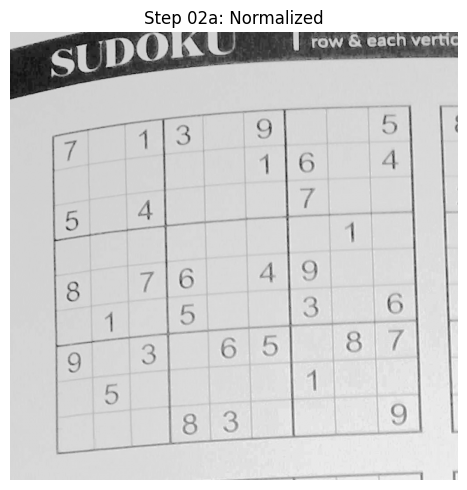

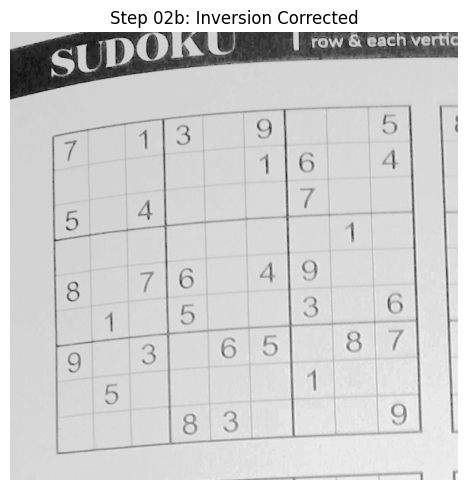

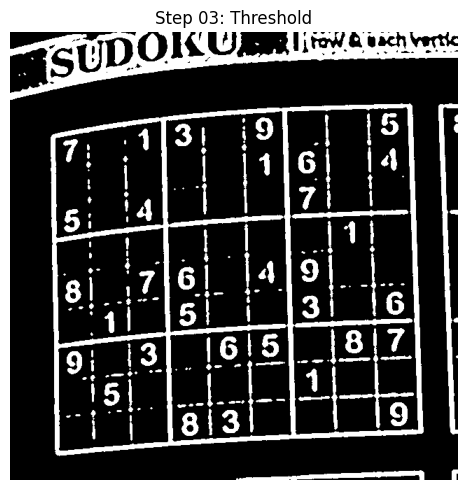

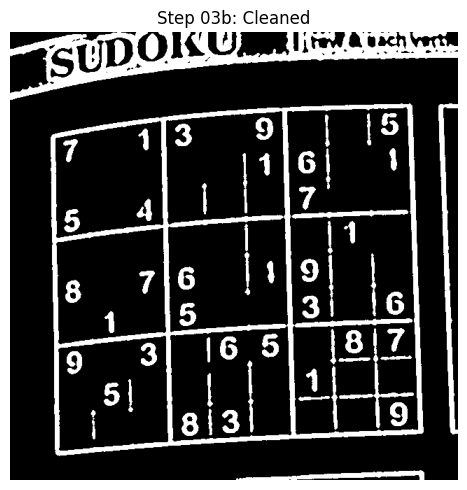

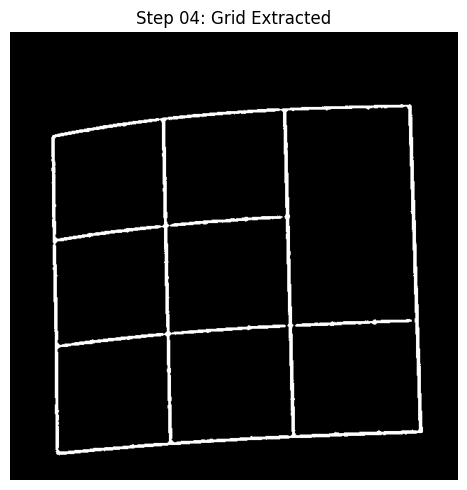

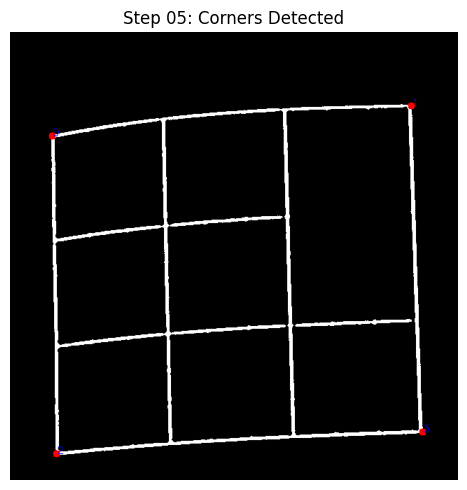

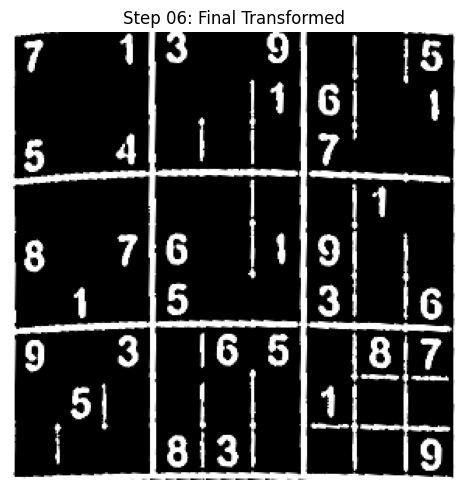

  Successfully processed and saved: trial\06.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 07.jpg (7/16)


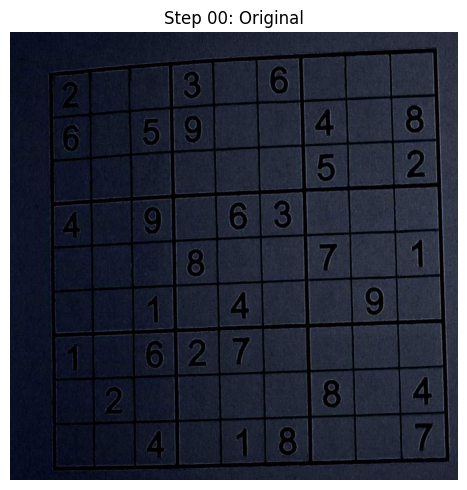

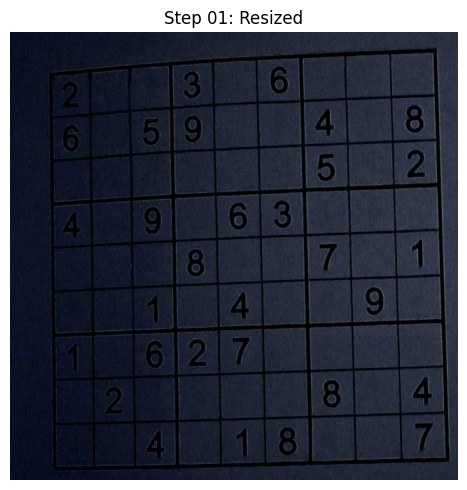

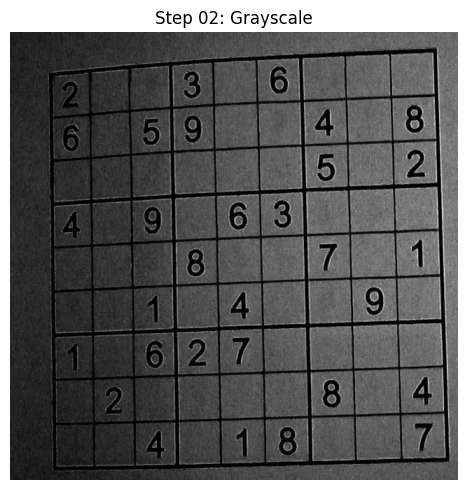

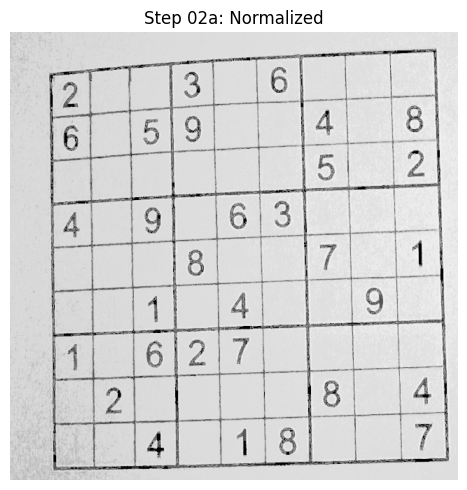

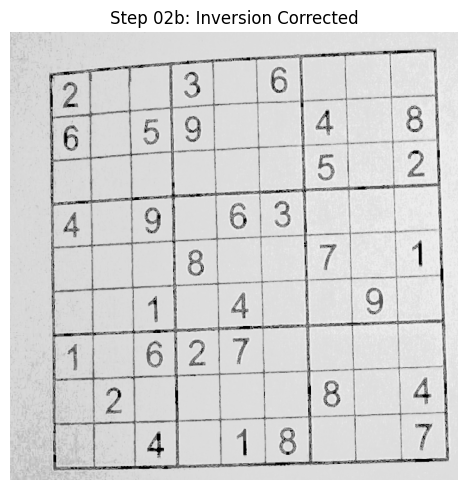

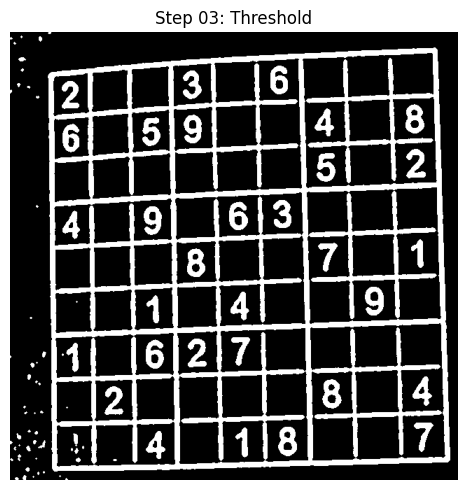

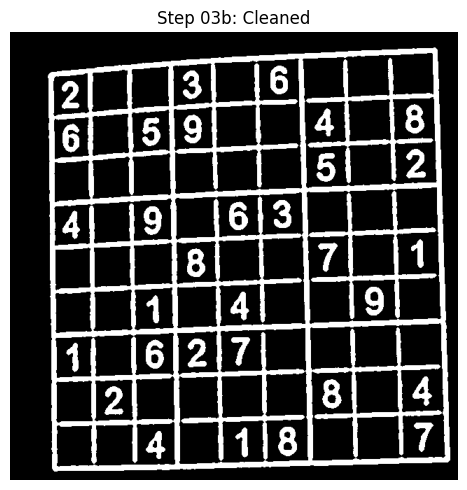

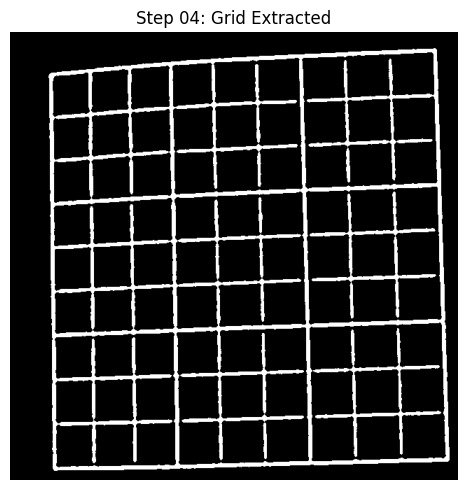

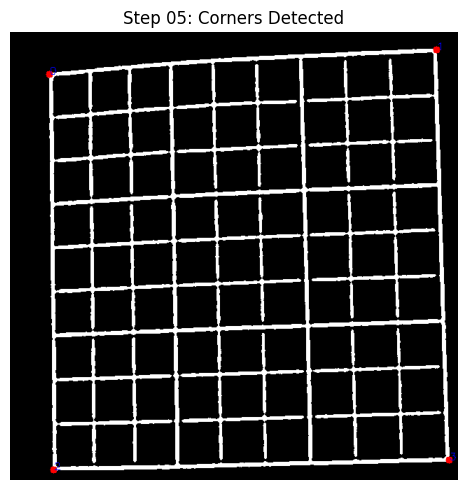

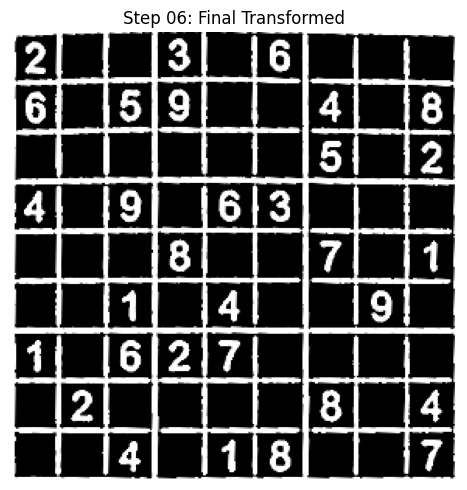

  Successfully processed and saved: trial\07.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 08.jpg (8/16)


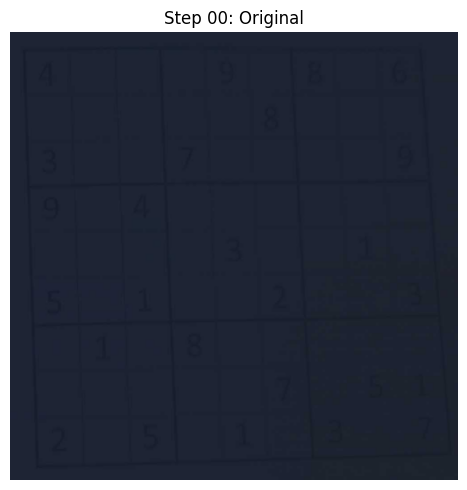

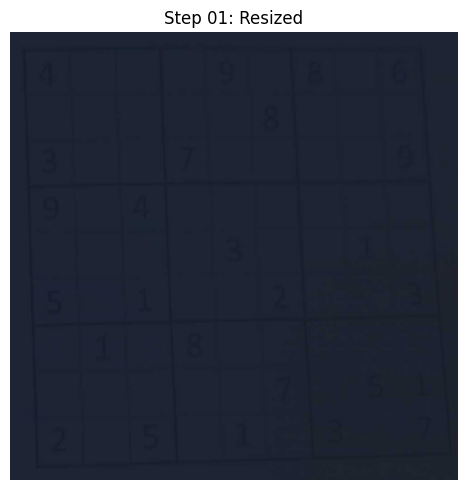

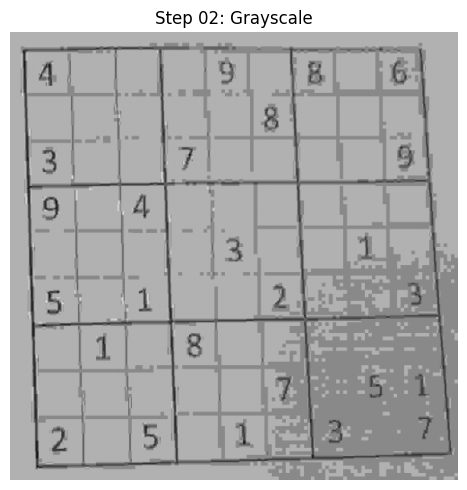

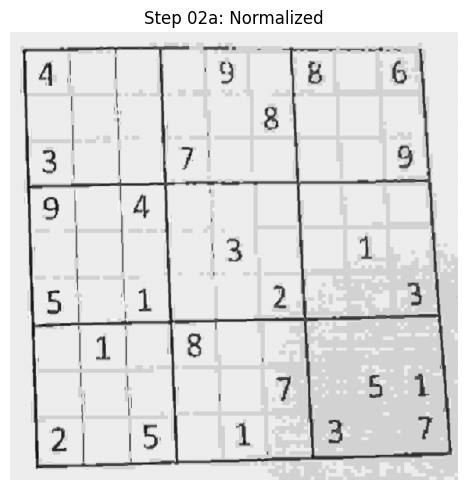

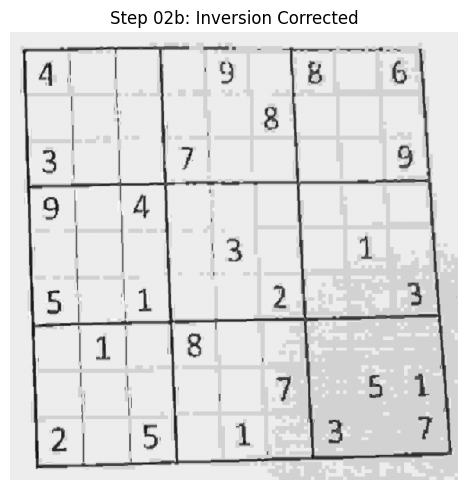

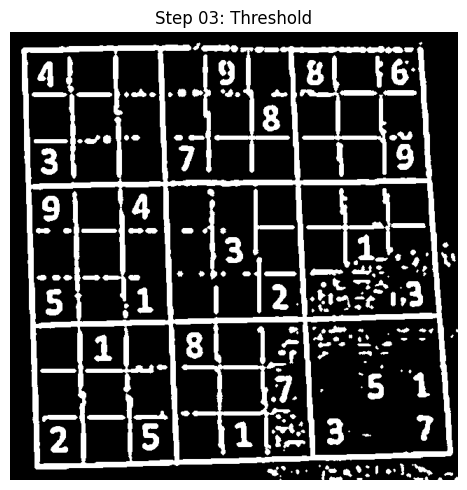

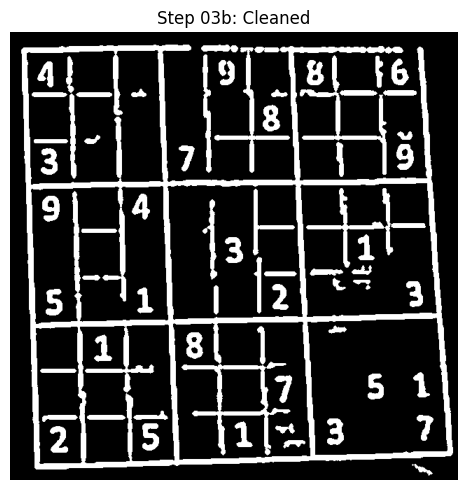

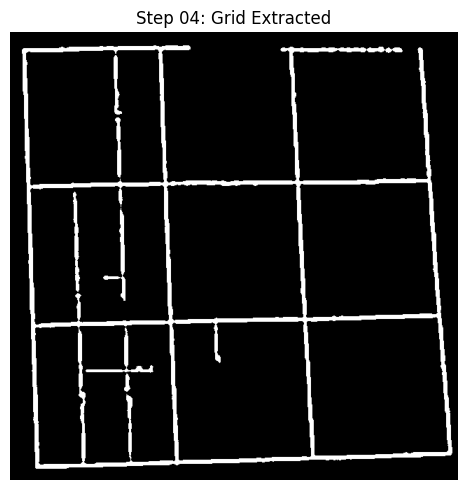

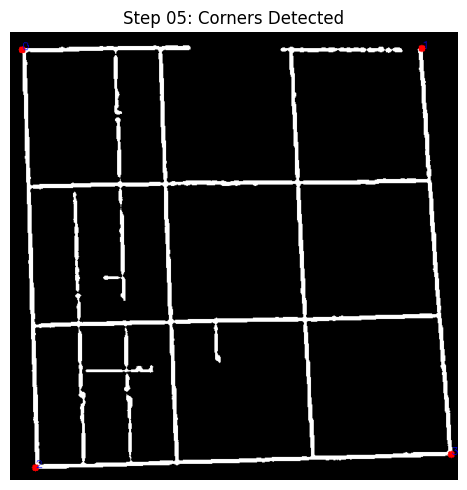

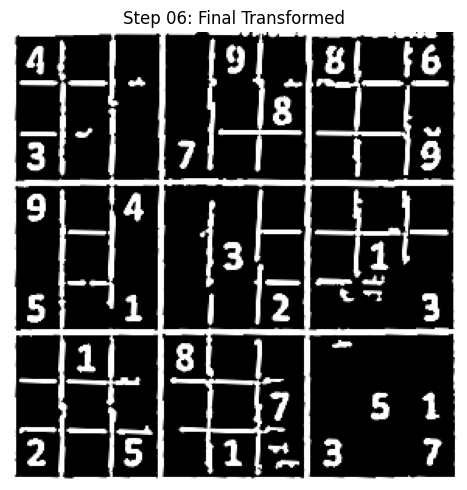

  Successfully processed and saved: trial\08.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 09.jpg (9/16)


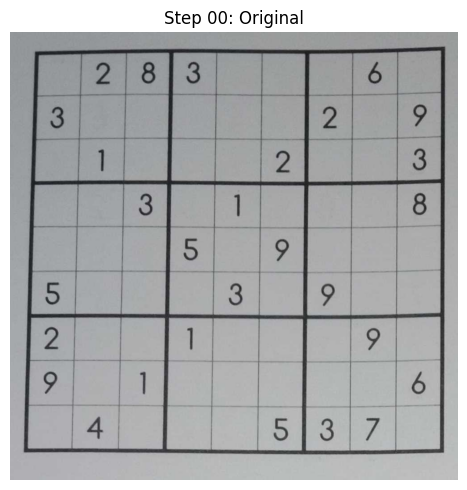

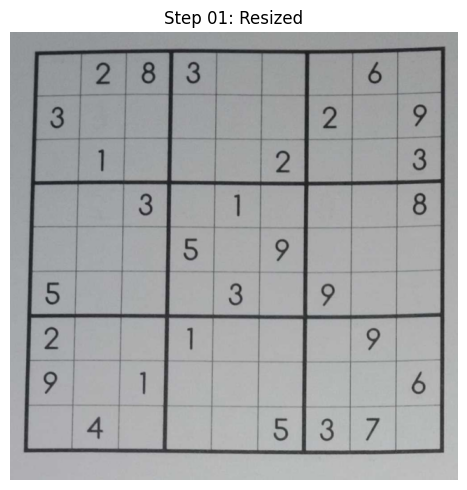

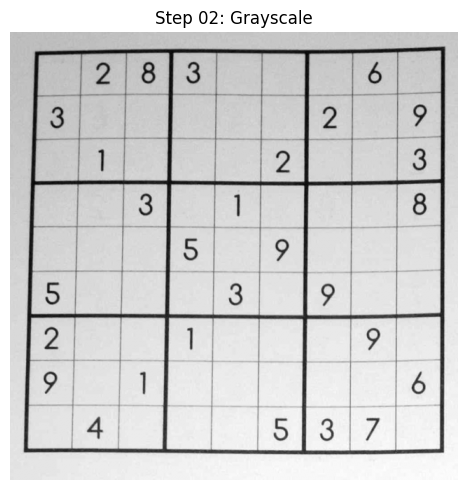

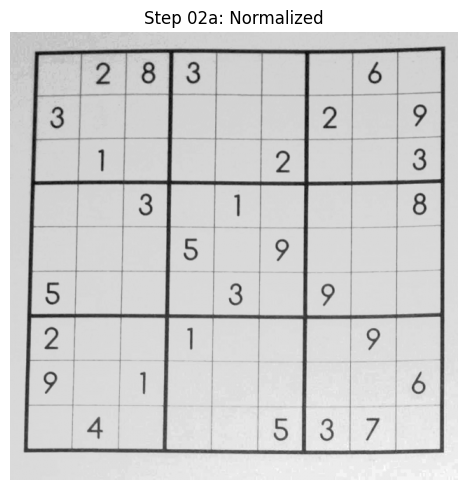

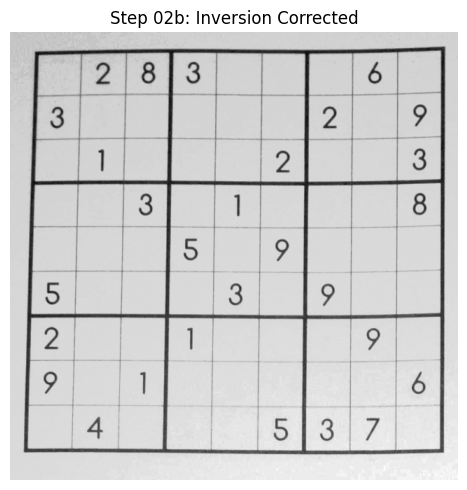

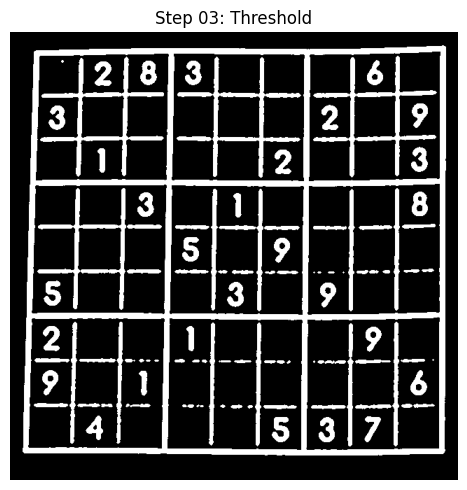

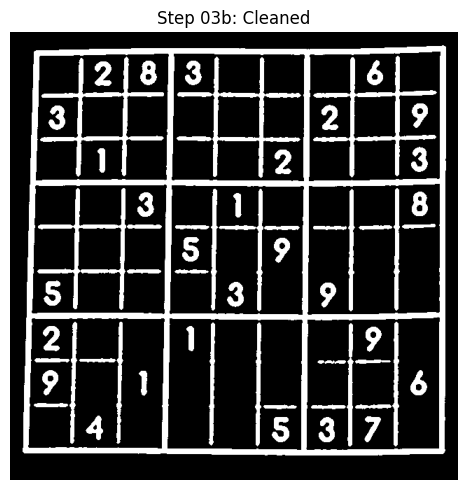

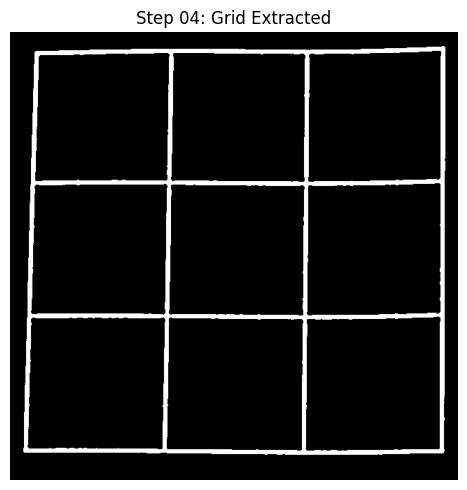

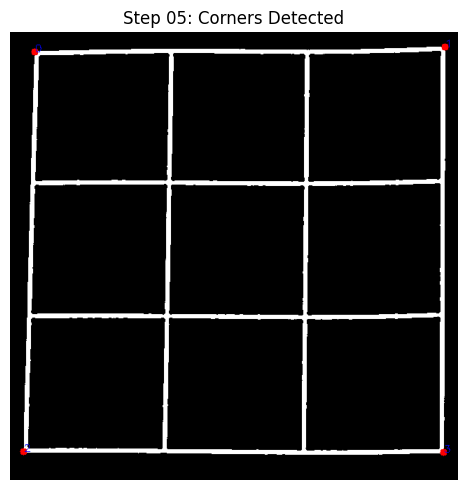

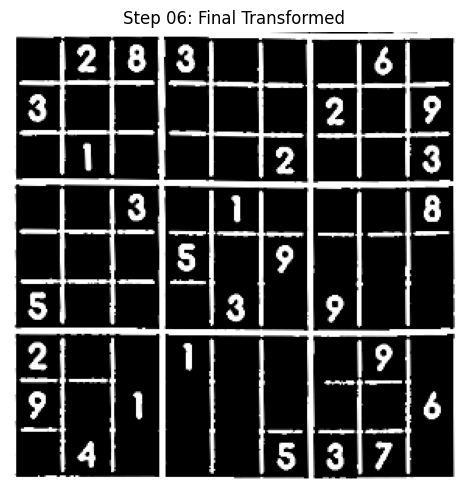

  Successfully processed and saved: trial\09.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 10.jpg (10/16)


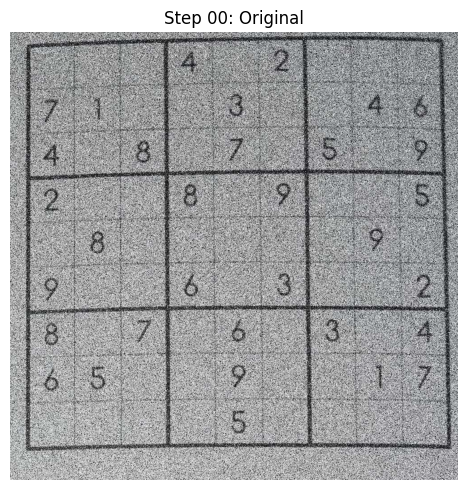

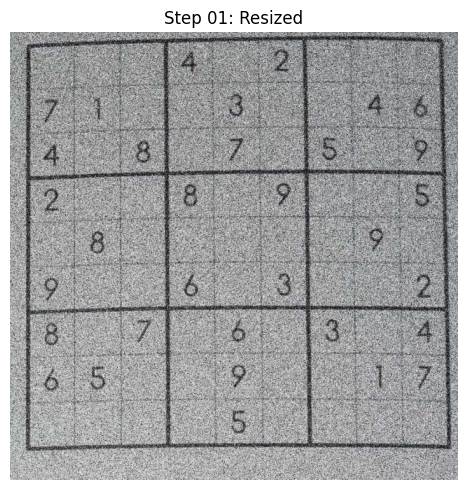

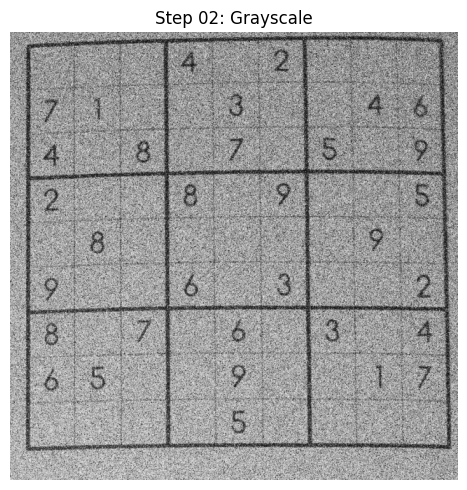

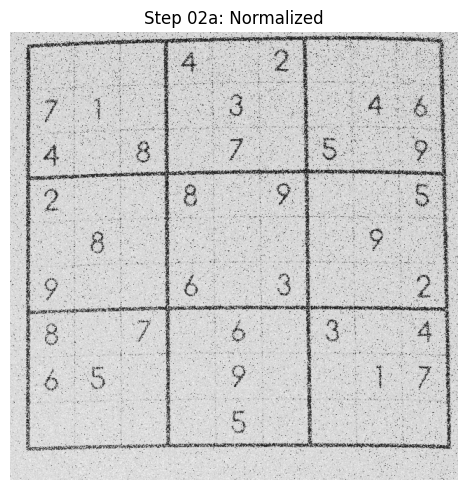

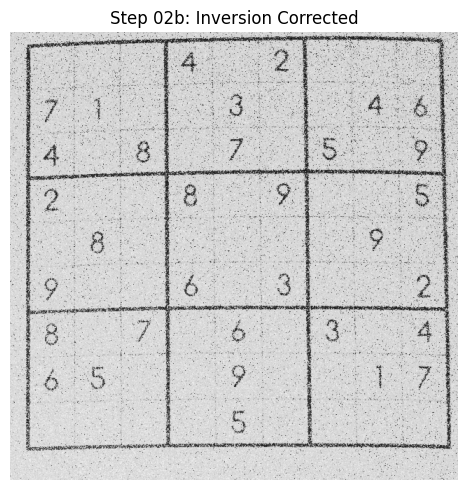

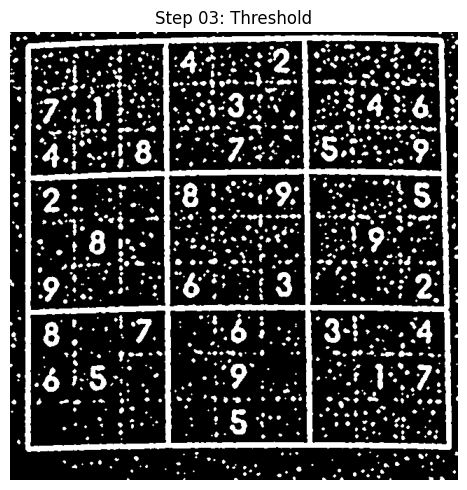

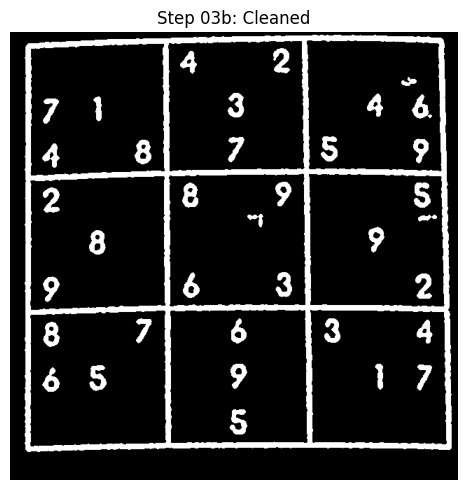

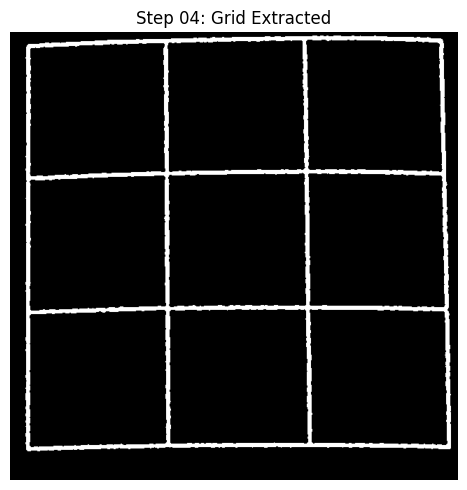

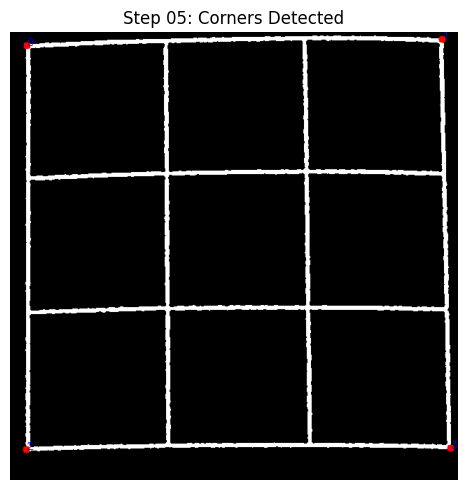

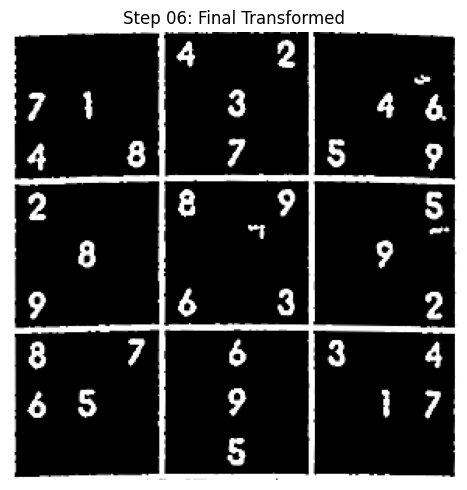

  Successfully processed and saved: trial\10.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 11.jpg (11/16)


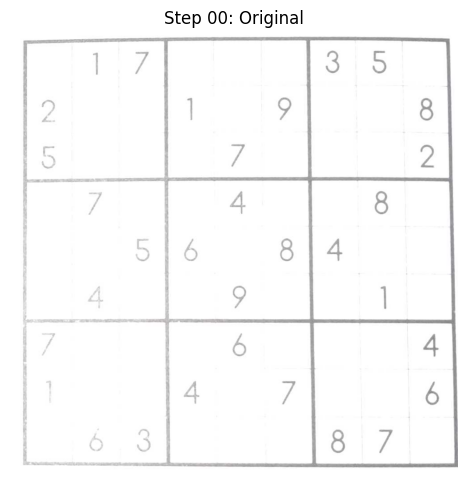

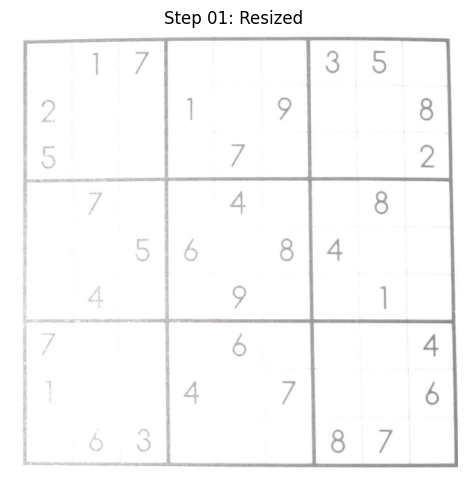

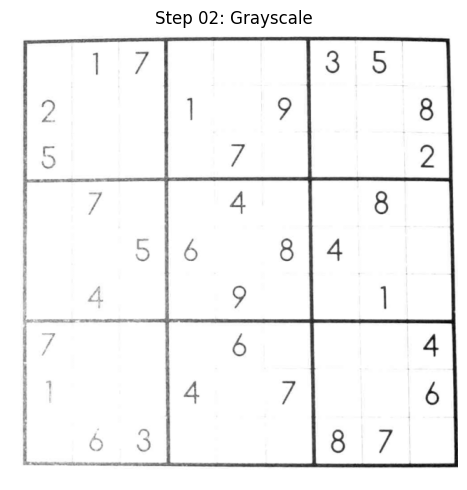

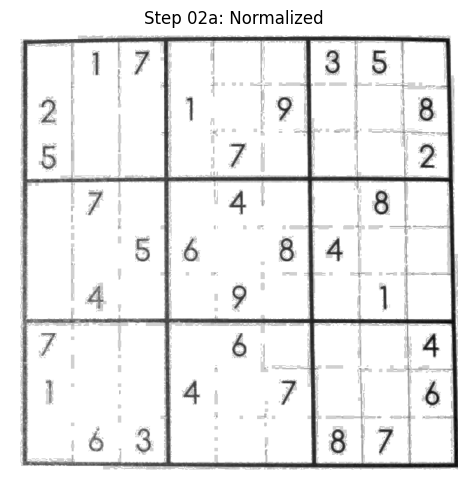

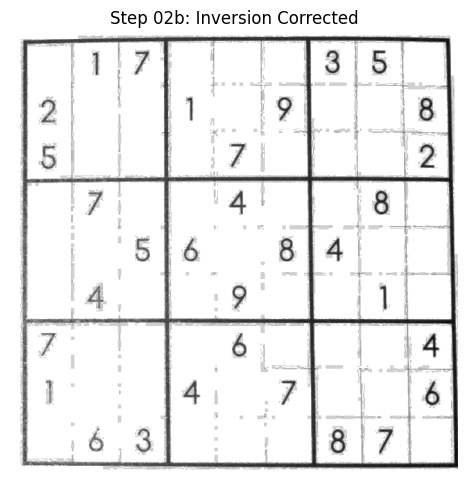

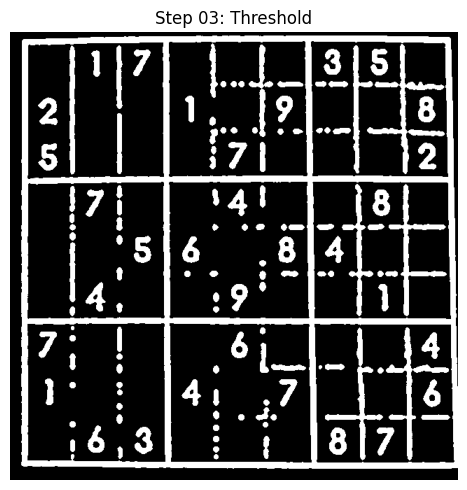

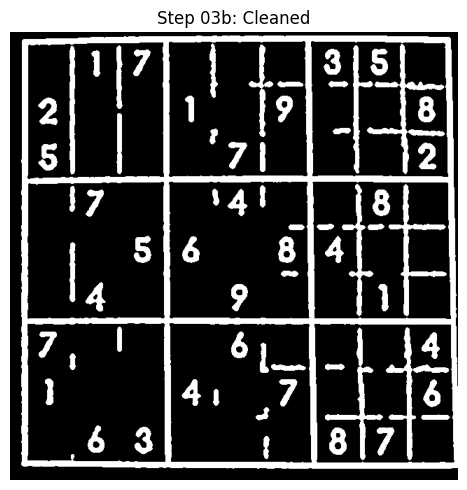

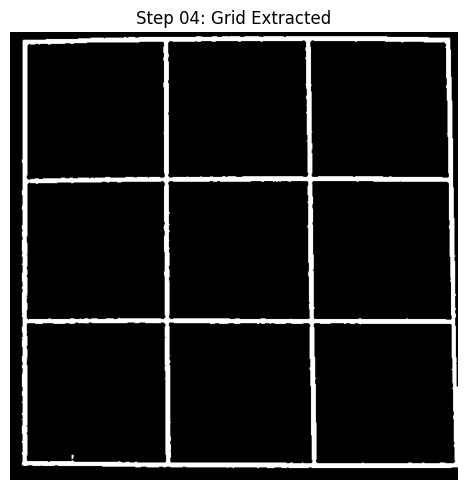

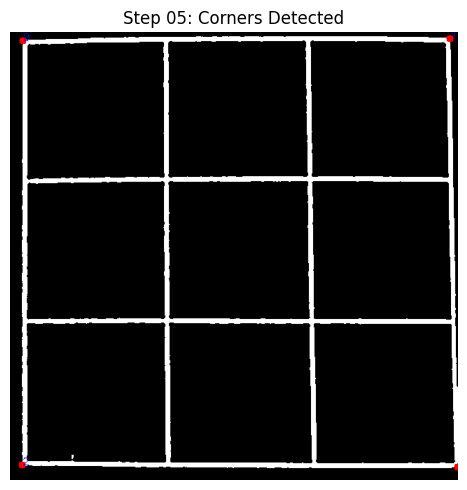

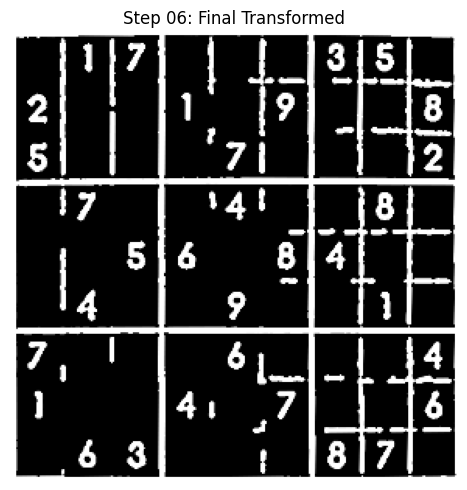

  Successfully processed and saved: trial\11.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 12.jpg (12/16)


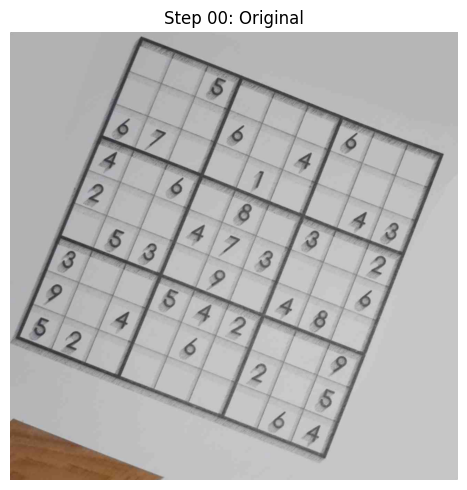

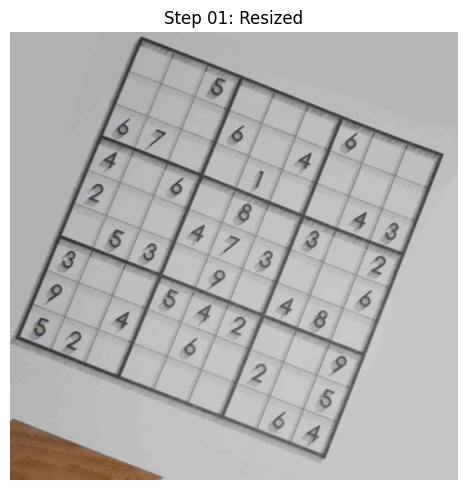

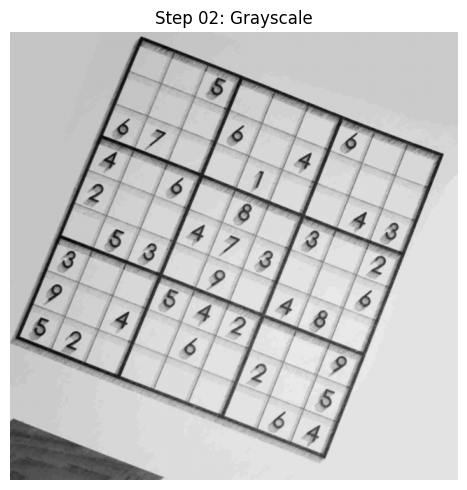

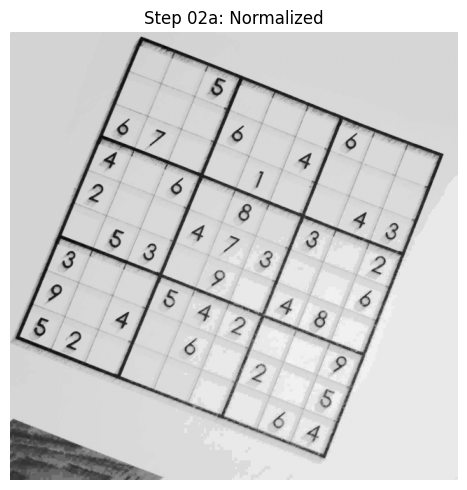

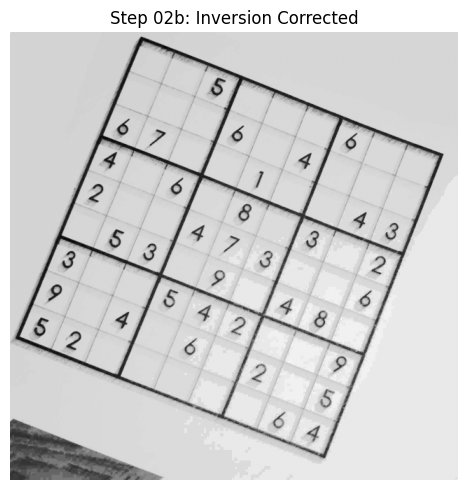

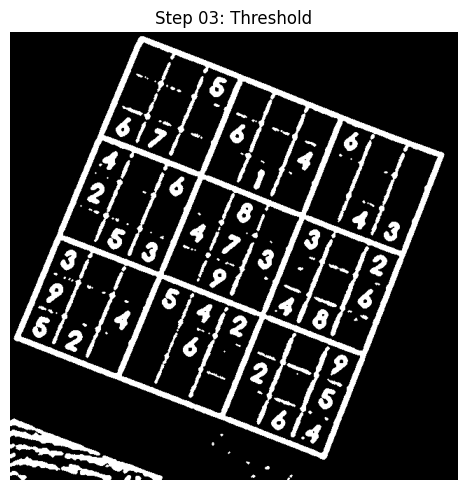

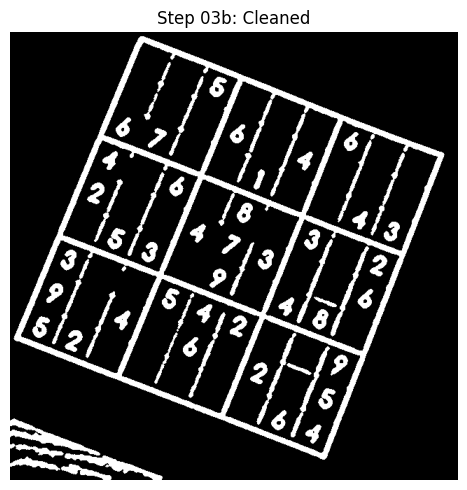

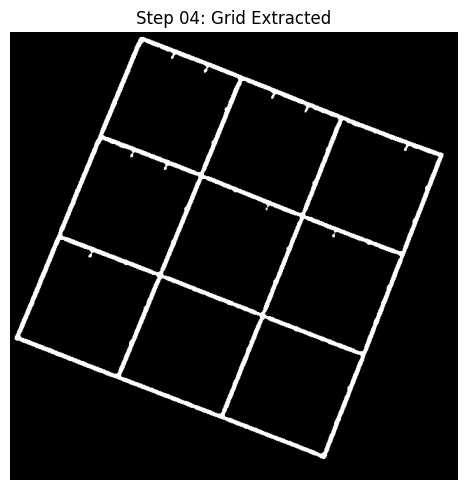

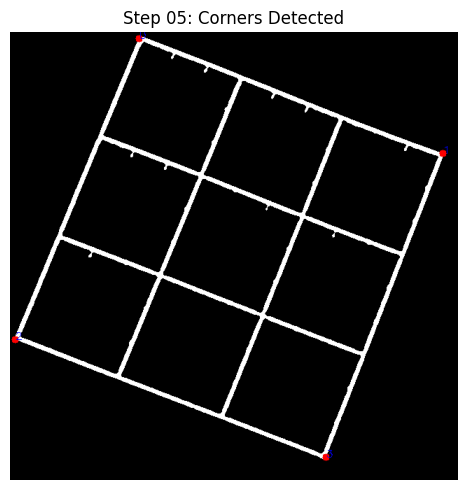

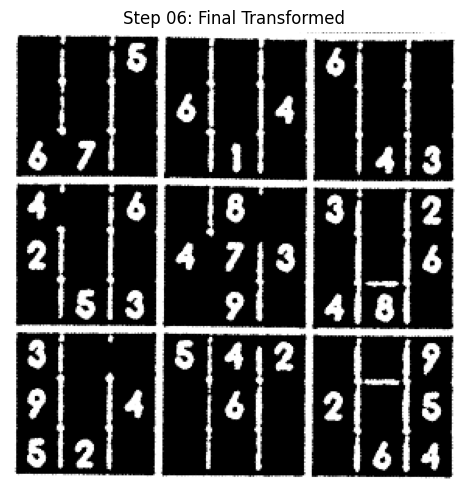

  Successfully processed and saved: trial\12.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 13.jpg (13/16)


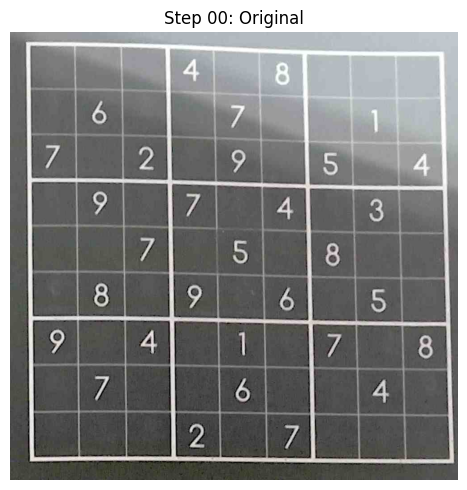

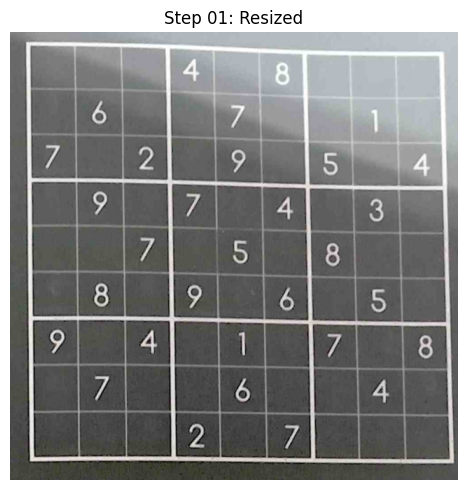

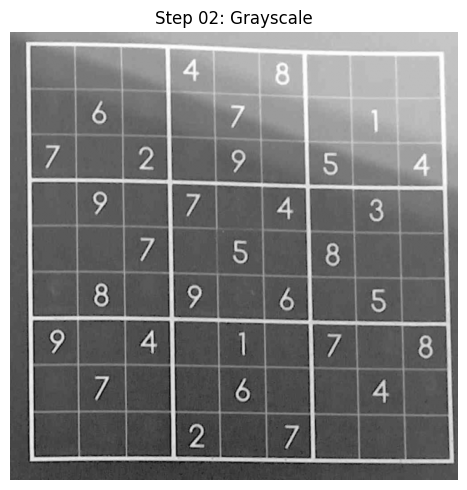

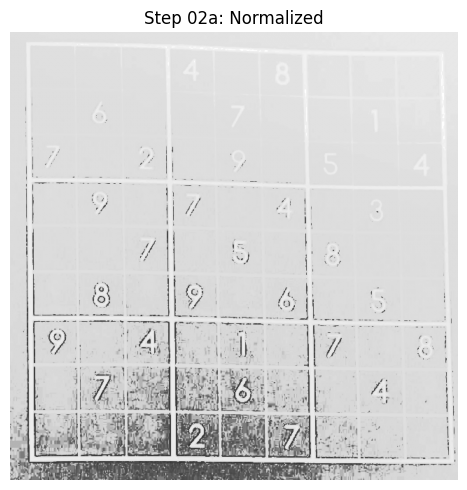

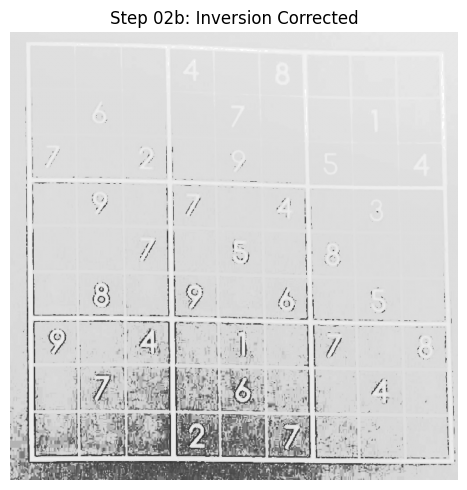

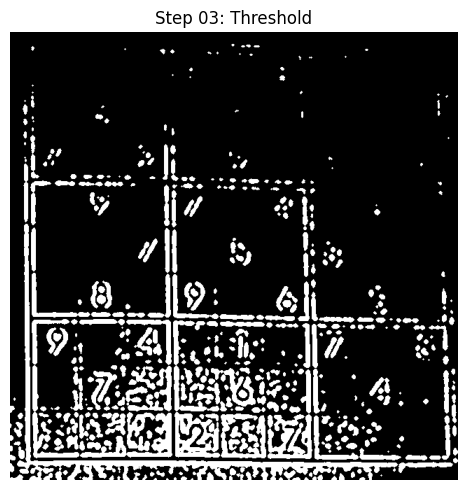

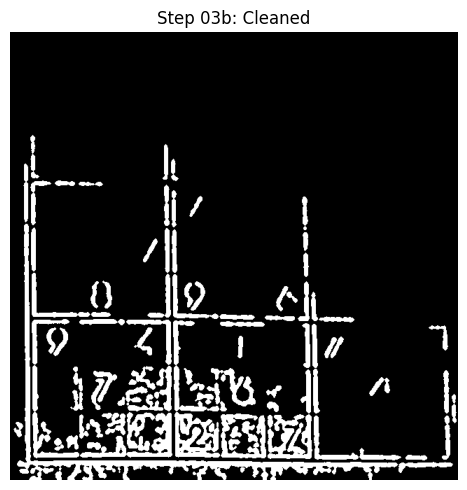

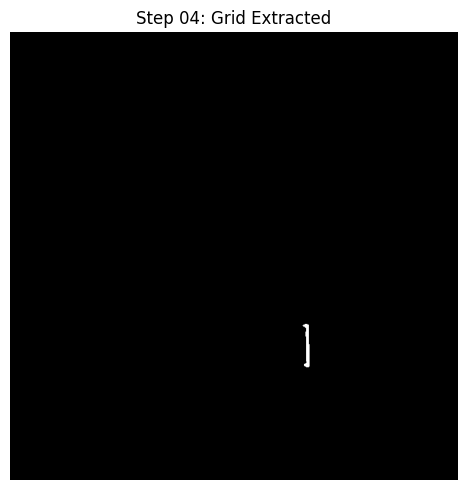

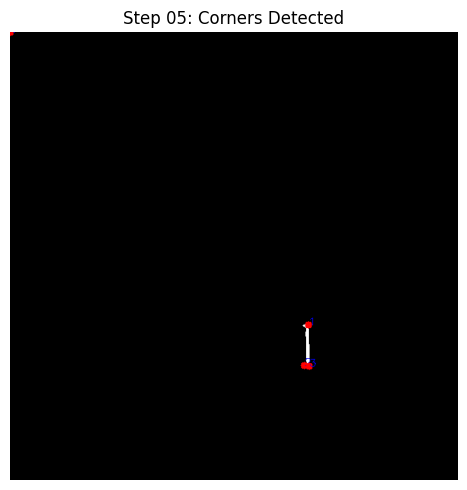

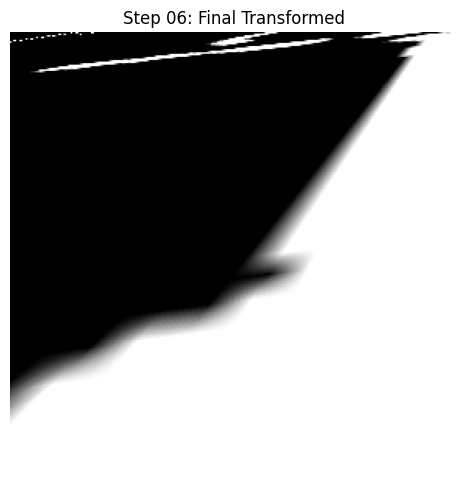

  Successfully processed and saved: trial\13.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 14.jpg (14/16)


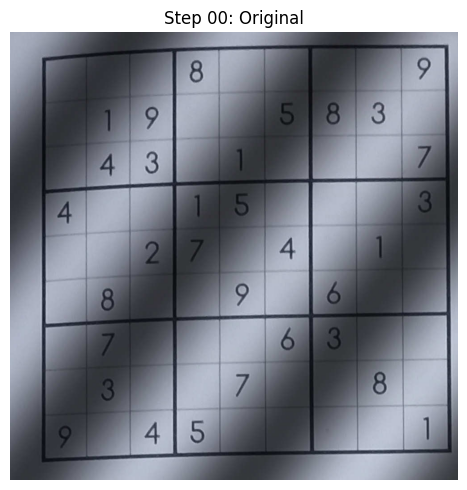

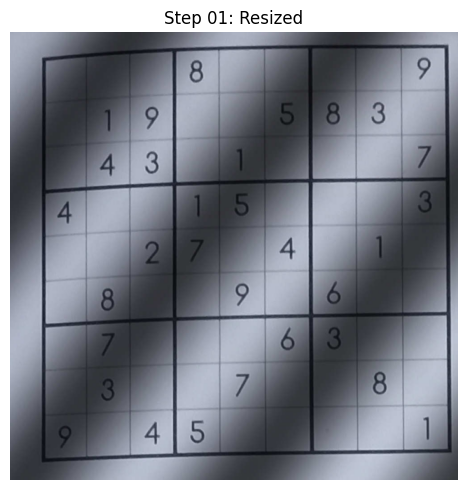

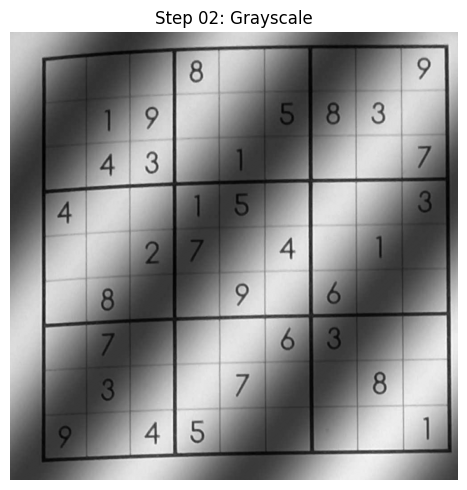

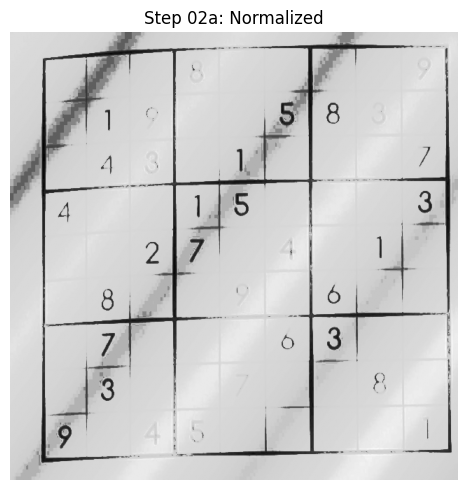

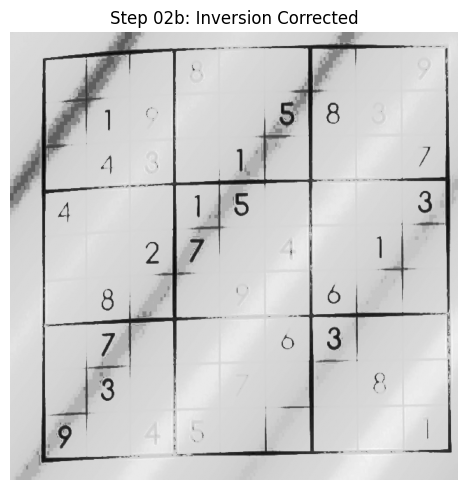

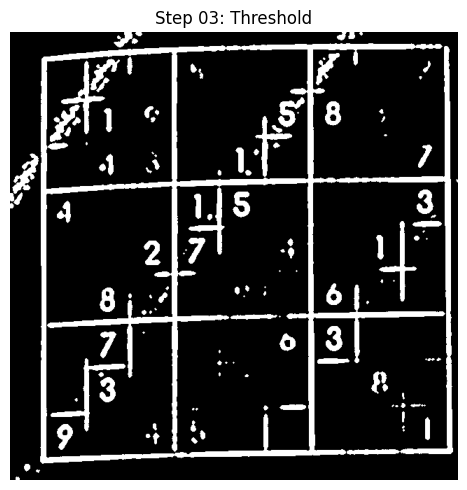

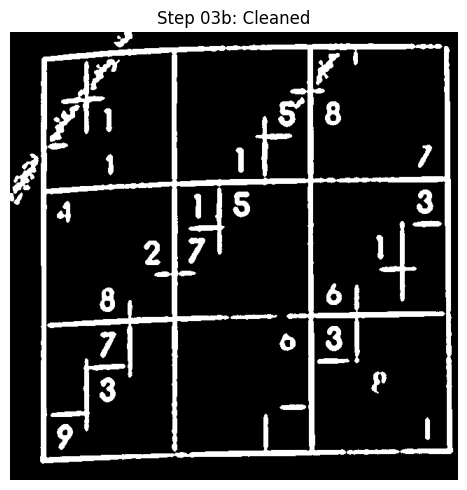

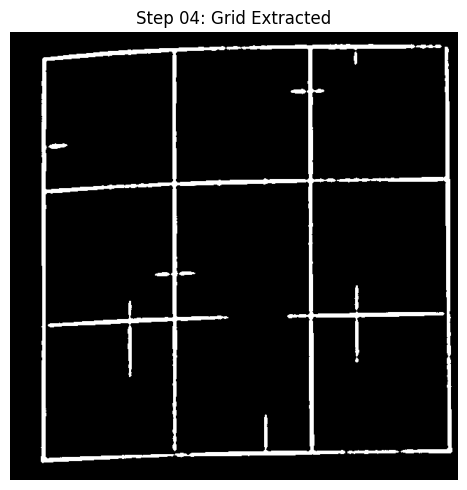

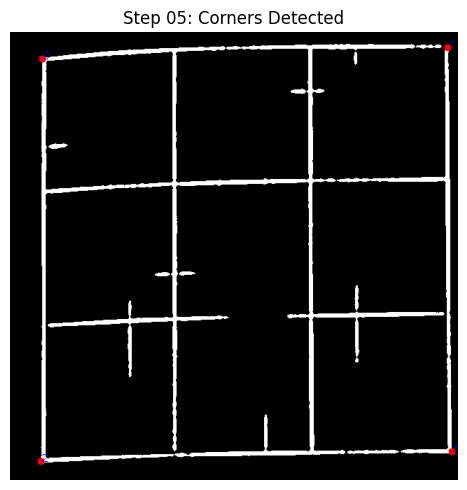

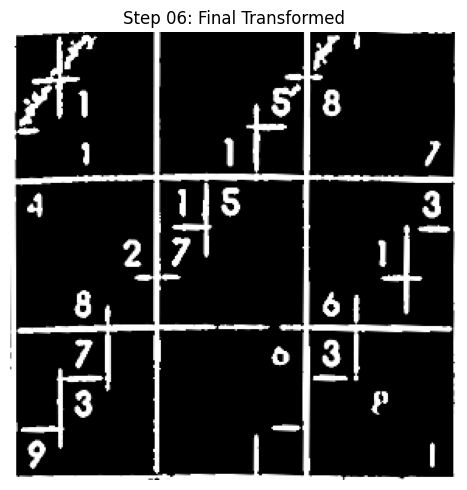

  Successfully processed and saved: trial\14.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 15.jpg (15/16)


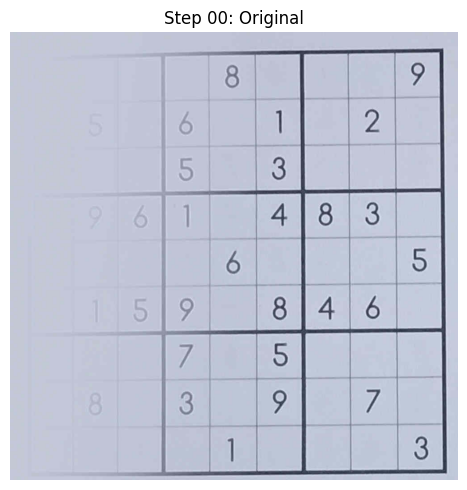

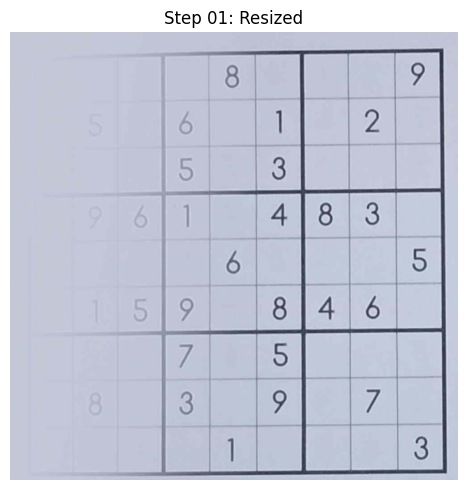

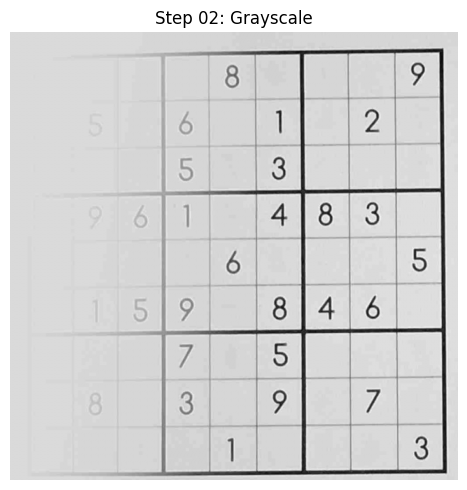

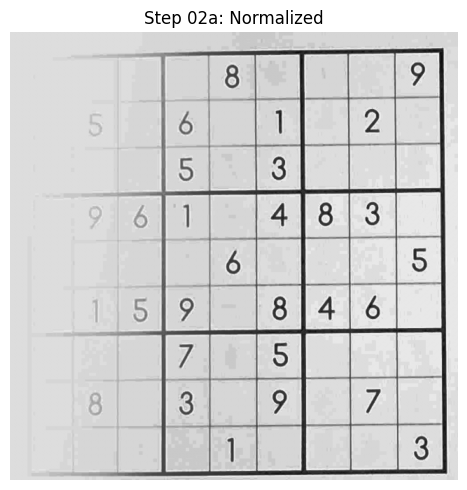

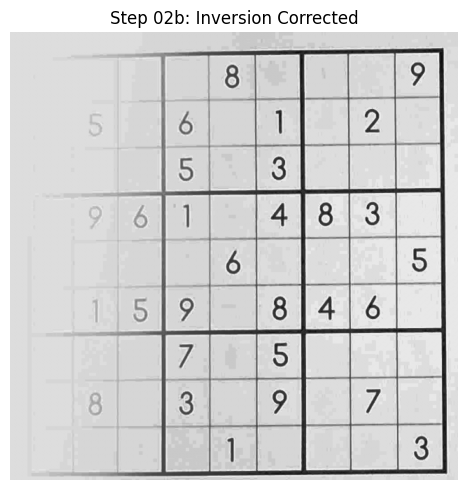

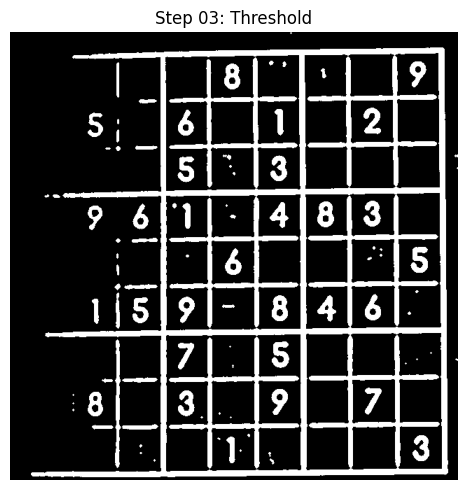

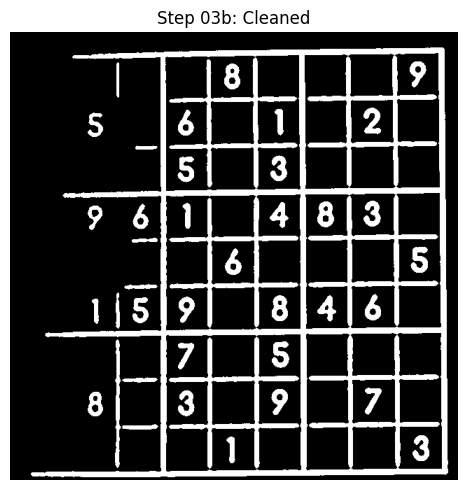

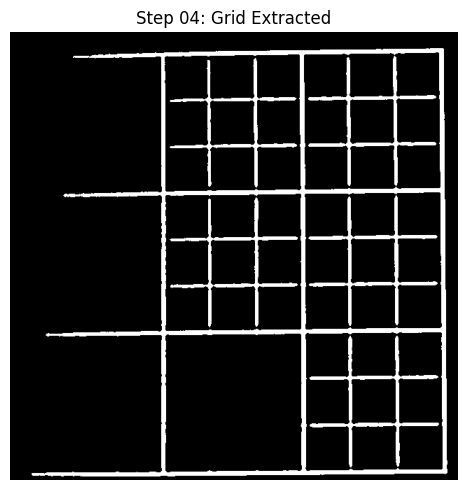

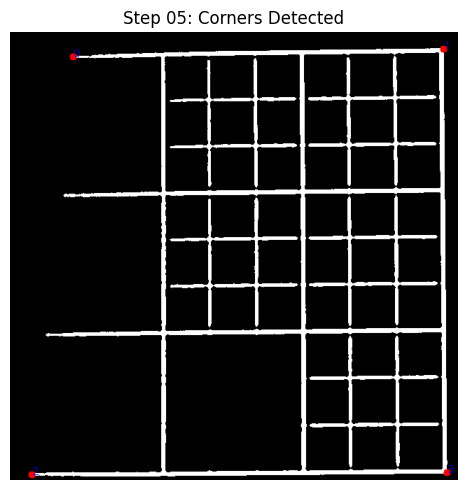

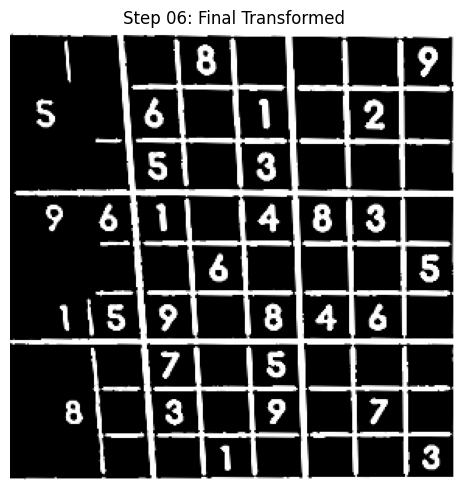

  Successfully processed and saved: trial\15.jpg
  Intermediate steps saved to: trial\processing_steps

Processing 16.jpg (16/16)


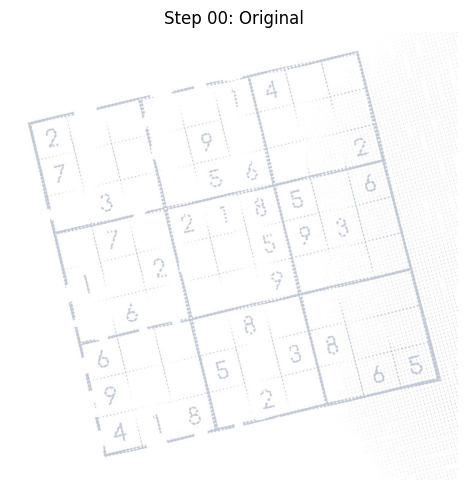

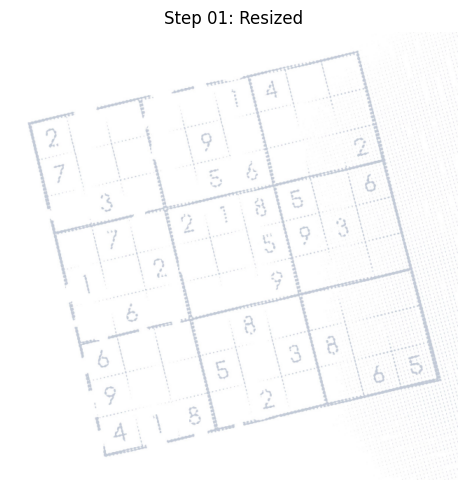

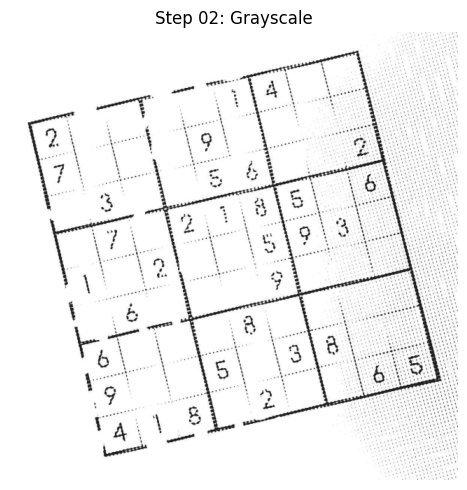

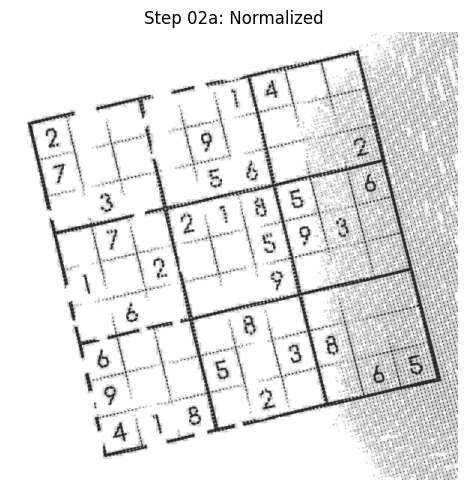

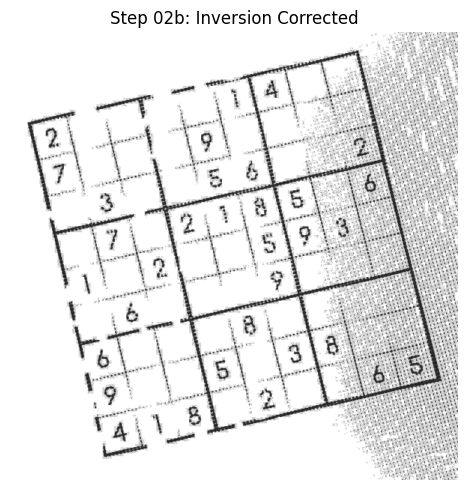

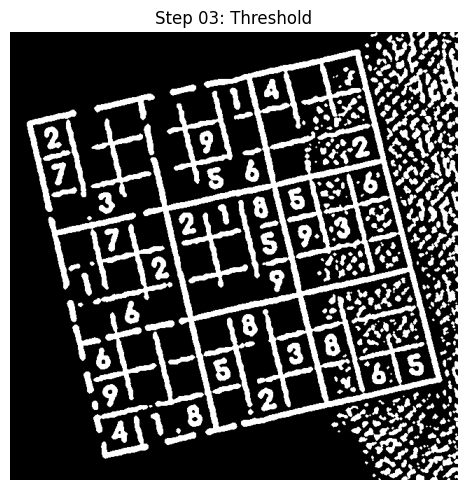

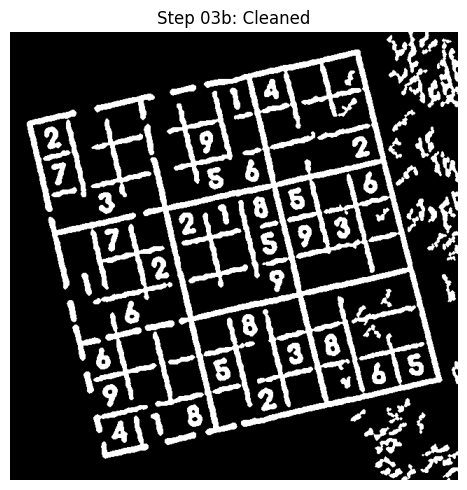

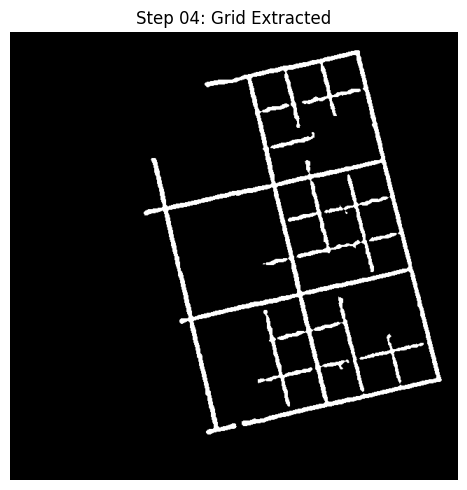

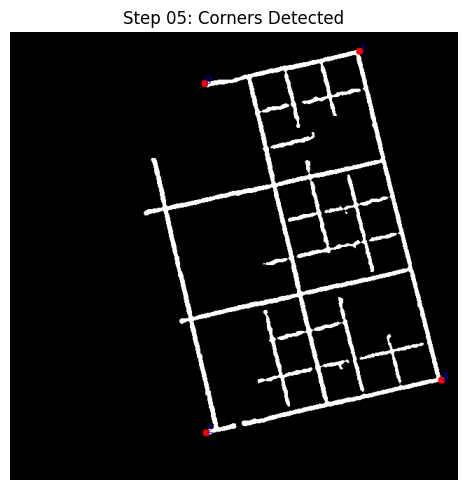

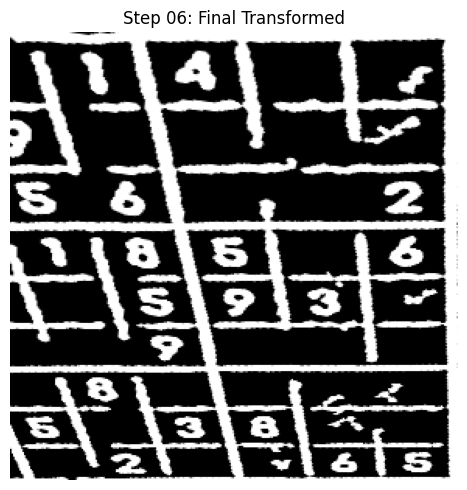

  Successfully processed and saved: trial\16.jpg
  Intermediate steps saved to: trial\processing_steps

Preprocessing complete!
Successful: 16, Failed: 0
Preprocessed grids saved to: trial
Processing steps saved to: trial\processing_steps


In [3]:
import cv2
import numpy as np
import os
from pathlib import Path
import matplotlib.pyplot as plt

# Display function for Colab
def display_saved_step(img, title):
    """Display an image in Colab using matplotlib"""
    plt.figure(figsize=(5, 5))
    if len(img.shape) == 3:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

star_kernel = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]], np.uint8)

def resize(img, max_side=640):
    """Resizes the image's largest side to 640 and the other proportionally."""
    factor = max_side / max(img.shape)
    img = cv2.resize(img.copy(), None, fx=factor, fy=factor,
                     interpolation=cv2.INTER_AREA)
    return img

def to_grayscale(img):
    """Converts a colored image to grayscale"""
    if img.shape[-1] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img

def is_inverted(image):
    """
    Detect if image is inverted by analyzing edge pixels.
    Assumes normal images have white background on edges.
    """
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    height, width = image.shape

    # Sample pixels from all four edges
    top_edge = image[0, :]
    bottom_edge = image[-1, :]
    left_edge = image[:, 0]
    right_edge = image[:, -1]

    # Count white pixels on edges (assuming background should be white)
    edge_pixels = np.concatenate([top_edge, bottom_edge, left_edge, right_edge])
    white_pixels = np.sum(edge_pixels > 128)
    total_edge_pixels = len(edge_pixels)

    white_ratio = white_pixels / total_edge_pixels

    # If less than 50% of edge pixels are white, it's inverted
    return white_ratio < 0.5

def ensure_white_background(image):
    """Ensure image has white background (normal orientation) Returns the image and whether it was inverted"""
    was_inverted = is_inverted(image)
    if was_inverted:
        print("  Detected inverted image - auto-correcting...")
        return 255 - image, True
    return image, False

def match_histogram(source, template):
    """ Match the histogram of source image to template image This normalizes brightness and contrast"""
    if len(source.shape) == 3:
        source = cv2.cvtColor(source, cv2.COLOR_BGR2GRAY)
    if len(template.shape) == 3:
        template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

    # Calculate histograms
    src_hist = cv2.calcHist([source], [0], None, [256], [0, 256])
    tpl_hist = cv2.calcHist([template], [0], None, [256], [0, 256])

    # Normalize histograms
    src_hist = src_hist / src_hist.sum()
    tpl_hist = tpl_hist / tpl_hist.sum()

    # Calculate cumulative distribution functions
    src_cdf = src_hist.cumsum()
    tpl_cdf = tpl_hist.cumsum()

    # Normalize CDFs
    src_cdf = (src_cdf - src_cdf.min()) * 255 / (src_cdf.max() - src_cdf.min())
    tpl_cdf = (tpl_cdf - tpl_cdf.min()) * 255 / (tpl_cdf.max() - tpl_cdf.min())

    # Create lookup table for histogram matching
    lookup_table = np.zeros(256, dtype=np.uint8)
    for i in range(256):
        diff = np.abs(tpl_cdf - src_cdf[i])
        lookup_table[i] = np.argmin(diff)

    # Apply lookup table
    matched = cv2.LUT(source, lookup_table)
    return matched

def normalize_brightness_contrast(image, reference_image):
    """
    Normalize brightness and contrast to match reference image
    """
    if len(image.shape) == 3:
        image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        image_gray = image.copy()

    if len(reference_image.shape) == 3:
        reference_gray = cv2.cvtColor(reference_image, cv2.COLOR_BGR2GRAY)
    else:
        reference_gray = reference_image.copy()

    # Resize reference to match image size if needed
    if reference_gray.shape != image_gray.shape:
        reference_gray = cv2.resize(reference_gray, (image_gray.shape[1], image_gray.shape[0]))

    # Match histogram
    normalized = match_histogram(image_gray, reference_gray)

    return normalized

def threshold(img, blur_size=13):
    """Applies a blur and thresholding to a grayscale image."""
    img = cv2.GaussianBlur(img, ksize=(blur_size, blur_size), sigmaX=0)
    img = cv2.adaptiveThreshold(
        img, maxValue=255, adaptiveMethod=0, thresholdType=1, blockSize=11, C=3)
    img = cv2.dilate(img, kernel=star_kernel)
    return img

def remove_small_components_advanced(img, min_area=25, connectivity=8):
    """
    Advanced small component removal with connectivity option
    """
    if len(img.shape) == 3:
        img_Gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img_Gray = img.copy()

    # Analyze connected components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(img_Gray, connectivity=connectivity)

    # Create output image
    output = np.zeros_like(img_Gray)

    # Keep only components larger than min_area
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            output[labels == i] = 255

    return output

def expose_grid(img):
    """
    Finds the biggest connected part in the image, the grid, and removes
    everything else from the images.
    """
    inverse = 255 - img
    mask = get_mask_like(img)
    size = min(inverse.shape)
    biggest_area = 0

    # looks for objects in the image, saving location of the largest
    for x in range(size // 4, 3 * (size // 4)):
        if inverse[x, x] == 0:
            area, img, _, _ = cv2.floodFill(
                inverse, mask, seedPoint=(x + 1, x + 1), newVal=64)
            if area > biggest_area:
                biggest_area = area
                point = (x, x)

    # removes everything but the objects
    img[img != 64] = 0

    # removes every object but the biggest
    mask = get_mask_like(img)
    area, img, _, _ = cv2.floodFill(
        inverse, mask, seedPoint=point, newVal=255)
    img[img != 255] = 0

    img = cv2.erode(img, kernel=star_kernel)
    return img

def find_corners(img):
    """
    Finds corners of the grid by sliding diagonal lines midwards from
    all corners.
    """
    height, width = img.shape[0] - 1, img.shape[1] - 1
    corners = np.zeros((4, 2), np.int32)
    LU_not, RU_not = True, True
    LD_not, RD_not = True, True
    for dist in range(min(img.shape)):
        for x in range(dist + 1):
            y = dist - x
            if img[y, x] == 255 and LU_not:
                corners[0] = (x, y)
                LU_not = False
            if img[y, width - x] == 255 and RU_not:
                corners[1] = (width - x, y)
                RU_not = False
            if img[height - y, x] == 255 and LD_not:
                corners[2] = (x, height - y)
                LD_not = False
            if img[height - y, width - x] == 255 and RD_not:
                corners[3] = ((width - x), (height - y))
                RD_not = False
        if not (LU_not or RU_not or LD_not or RD_not):
            break
    return corners
def transform(img, corners, size=288):
    """Zooms into image using corners."""
    assert (size % 9) == 0
    boundary = np.float32([[0, 0], [size, 0], [0, size], [size, size]])
    M = cv2.getPerspectiveTransform(corners.astype(np.float32), boundary)
    img = cv2.warpPerspective(img, M, (size, size))
    return img
def get_mask_like(img):
    """Constructs an array of zeros like the input image with one field padding on
    all four sides.
    (Used for some OpenCV functions)
    """
    return np.zeros((img.shape[0] + 2, img.shape[1] + 2), dtype=np.uint8)
def save_step_image(img, step_name, output_dir, prefix_fileN):
    """Save an image from a processing step with descriptive filename"""
    if img is None:
        return

    base_name = os.path.splitext(prefix_fileN)[0]
    out_fil_name = f"{base_name}_{step_name}.png"
    output_path = os.path.join(output_dir, out_fil_name)

    cv2.imwrite(output_path, img)
    return output_path

reference_image = None

def load_reference_image(reference_path):
    """Load and preprocess the reference image for histogram matching"""
    global reference_image
    if reference_image is None:
        ref_img = cv2.imread(reference_path)
        if ref_img is None:
            print(f"Error: Could not load reference image {reference_path}")
            return None

        ref_img_resized = resize(ref_img)
        ref_img_gray = to_grayscale(ref_img_resized)
        ref_img_corrected, _ = ensure_white_background(ref_img_gray)
        reference_image = ref_img_corrected

    return reference_image

def preprocess_sudoku_image(image_path, output_size=288, save_steps=False, s_out_dir=None, prefix_fileN=None, reference_img=None):
    """Process a single sudoku image through the preprocessing pipeline only"""
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not read image {image_path}")
        return None

    if save_steps and s_out_dir:
        save_step_image(img, "00_original", s_out_dir, prefix_fileN)
        display_saved_step(img, "Step 00: Original")

    img_resized = resize(img)
    if save_steps and s_out_dir:
        save_step_image(img_resized, "01_resized", s_out_dir, prefix_fileN)
        display_saved_step(img_resized, "Step 01: Resized")

    img_Gray = to_grayscale(img_resized)
    if save_steps and s_out_dir:
        save_step_image(img_Gray, "02_grayscale", s_out_dir, prefix_fileN)
        display_saved_step(img_Gray, "Step 02: Grayscale")

    if reference_img is not None:
        img_normalized = normalize_brightness_contrast(img_Gray, reference_img)
        if save_steps and s_out_dir:
            save_step_image(img_normalized, "02a_normalized", s_out_dir, prefix_fileN)
            display_saved_step(img_normalized, "Step 02a: Normalized")
        img_Gray = img_normalized

    img_corrected, was_inverted = ensure_white_background(img_Gray)
    if save_steps and s_out_dir:
        save_step_image(img_corrected, "02b_inversion_corrected", s_out_dir, prefix_fileN)
        display_saved_step(img_corrected, "Step 02b: Inversion Corrected")

    img_threshold = threshold(img_corrected)
    if save_steps and s_out_dir:
        save_step_image(img_threshold, "03_threshold", s_out_dir, prefix_fileN)
        display_saved_step(img_threshold, "Step 03: Threshold")

    img_good = remove_small_components_advanced(img_threshold, min_area=150, connectivity=8)
    if save_steps and s_out_dir:
        save_step_image(img_good, "03b_cleaned", s_out_dir, prefix_fileN)
        display_saved_step(img_good, "Step 03b: Cleaned")

    img_grid = expose_grid(img_good)
    if save_steps and s_out_dir:
        save_step_image(img_grid, "04_grid_extracted", s_out_dir, prefix_fileN)
        display_saved_step(img_grid, "Step 04: Grid Extracted")

    corners = find_corners(img_grid)

    # Create visualization of corners on grid
    if save_steps and s_out_dir:
        corners_vis = cv2.cvtColor(img_grid.copy(), cv2.COLOR_GRAY2BGR)
        for i, corner in enumerate(corners):
            cv2.circle(corners_vis, tuple(corner), 5, (0, 0, 255), -1)
            cv2.putText(corners_vis, str(i), tuple(corner),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)
        save_step_image(corners_vis, "05_corners_detected", s_out_dir, prefix_fileN)
        display_saved_step(corners_vis, "Step 05: Corners Detected")

    img_transformed = transform(img_good, corners, output_size)
    if save_steps and s_out_dir:
        save_step_image(img_transformed, "06_final_transformed", s_out_dir, prefix_fileN)
        display_saved_step(img_transformed, "Step 06: Final Transformed")

    return img_transformed

def process_images_folder(input_folder="images", output_folder="trial", save_steps=True, reference_image_path=None):
    """Process all images in the input folder and save preprocessed grids and intermediate steps"""
    Path(output_folder).mkdir(exist_ok=True)

    steps_dir = None
    if save_steps:
        steps_dir = os.path.join(output_folder, "processing_steps")
        Path(steps_dir).mkdir(exist_ok=True)

    reference_img = None
    if reference_image_path and os.path.exists(reference_image_path):
        reference_img = load_reference_image(reference_image_path)
        if reference_img is not None:
            print(f"Using reference image: {reference_image_path}")
        else:
            print(f"Warning: Could not load reference image {reference_image_path}")
    else:
        print("No reference image provided - skipping brightness/contrast normalization")

    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.tif'}
    image_files = [f for f in os.listdir(input_folder)
                  if os.path.splitext(f)[1].lower() in image_extensions]

    image_files.sort()

    if not image_files:
        print(f"No images found in {input_folder} folder")
        return

    print(f"Found {len(image_files)} images to process")
    print(f"Input folder: {input_folder}")
    print(f"Output folder: {output_folder}")
    if save_steps:
        print(f"Steps folder: {steps_dir}")

    successful = 0
    failed = 0

    for i, image_file in enumerate(image_files):
        image_path = os.path.join(input_folder, image_file)
        print(f"\nProcessing {image_file} ({i+1}/{len(image_files)})")

        try:
            processed_grid = preprocess_sudoku_image(
                image_path,
                save_steps=save_steps,
                s_out_dir=steps_dir,
                prefix_fileN=image_file,
                reference_img=reference_img
            )
            if processed_grid is not None:
                output_path = os.path.join(output_folder, image_file)
                cv2.imwrite(output_path, processed_grid)

                print(f"  Successfully processed and saved: {output_path}")
                if save_steps:
                    print(f"  Intermediate steps saved to: {steps_dir}")
                successful += 1
            else:
                print(f"   Failed to process {image_file}")
                failed += 1

        except Exception as e:
            print(f"   Error processing {image_file}: {str(e)}")
            failed += 1

    print(f"\nPreprocessing complete!")
    print(f"Successful: {successful}, Failed: {failed}")
    print(f"Preprocessed grids saved to: {output_folder}")
    if save_steps:
        print(f"Processing steps saved to: {steps_dir}")

if __name__ == "__main__":
    process_images_folder("images", "trial", save_steps=True, reference_image_path="images/01.jpg")